## Installing Necessary Libraries

For this project concentrated on a benchmarking comparison, universal forecasters are being compared against common traditional learning methods to predict times series data specifically in relation to oil, gas and water in the oil sector, which is a particular interest to the supervising organization ADNOC. As the first stage of my internship project, I performed an EDA on the data given by my supervisor, which originates from Volve.

# EDA

Overall Objective: To successfully perform an EDA on the data, understand it and its background information, prepare the data for model inference/training, find general trends, extract relvant information and important features, transform the data if needed and reach a conclusion on the next steps to take for the data.

## Importing Libraries & Setup

Objective: Set up notebook to maximize usability and visibility

First, I had to import all the libraries all the necessary libraries that will be used to it throughout the EDA and did some preliminary setup to improve the display of outputs for both me and my supervisors.

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from matplotlib.dates import DateFormatter, MonthLocator
from statsmodels.tsa.stattools import adfuller, kpss
import plotly.graph_objects as go
from statsmodels.tsa.stattools import InterpolationWarning
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

In [70]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000) # setting up pandas display options to show more data in cell outputs

In [71]:
# path = "/content/drive/MyDrive/Internship/"
path = ""

In [72]:
# from google.colab import drive
# drive.mount('/content/drive') # mounting drive where files are stored

## General Dataset Overview

Objective: This section is intended to gain a general overview of data and understand its requirements for setup to be ready for analysis

I observed the general overview of the data to get a sense for the structure of the data and clearly understand the problem and the task at hand.

In [73]:
df = pd.read_excel(path + "data/Volve/Volve production data.xlsx") # reading dataset from excel sheet
df.head() # displaying general view of data

,DATEPRD,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DOWNHOLE_TEMPERATURE,AVG_DP_TUBING,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,WELL_TYPE
0,2014-04-07,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.00000,0.00000,0.00000,0.0,0.000000,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,WI
1,2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.0,1.003059,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
2,2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.0,0.979008,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
3,2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.0,0.545759,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
4,2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,310.37614,96.87589,277.27826,0.0,1.215987,%,33.09788,10.47992,33.07195,0.0,0.0,0.0,NaN,production,OP


I renamed the columns to more human-readable names to both ease understanding of the data as well as simplify usability in the future.

In [74]:
df.rename(columns={
    'DATEPRD': 'date',
    'NPD_WELL_BORE_CODE': 'well_name',
    'ON_STREAM_HRS': 'prod_hrs',
    'AVG_DOWNHOLE_PRESSURE': 'bhp',
    'AVG_DOWNHOLE_TEMPERATURE': 'bht',
    'AVG_DP_TUBING': 'dp_tubing',
    'AVG_WHP_P': 'whp',
    'AVG_WHT_P': 'wht',
    'DP_CHOKE_SIZE': 'choke_size_percentage',
    'BORE_OIL_VOL': 'oil_vol',
    'BORE_GAS_VOL': 'gas_vol',
    'BORE_WAT_VOL': 'water_vol',
    "WELL_TYPE": "well_type"
}, inplace=True) # renaming columns to more human-readable columns
df

,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,BORE_WI_VOL,FLOW_KIND,well_type
0,2014-04-07,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.00000,0.00000,0.00000,0.00000,0.000000,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,WI
1,2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.00000,1.003059,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
2,2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.00000,0.979008,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
3,2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.00000,0.545759,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
4,2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,310.37614,96.87589,277.27826,0.00000,1.215987,%,33.09788,10.47992,33.07195,0.0,0.0,0.0,NaN,production,OP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-09-14,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.27272,0.636088,%,0.07776,0.22879,0.01862,0.0,0.0,0.0,NaN,production,OP
15630,2016-09-15,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.28686,0.670794,%,0.08545,0.22914,0.00631,0.0,0.0,0.0,NaN,production,OP
15631,2016-09-16,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.28604,0.664393,%,0.08544,0.22896,0.01181,0.0,0.0,0.0,NaN,production,OP
15632,2016-09-17,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.27212,0.624660,%,0.07497,0.22846,0.02576,0.0,0.0,0.0,NaN,production,OP


In [75]:
print("There are", len(df.columns), "columns in the dataset\nColumns:")
list(df.columns)

There are 24 columns in the dataset
Columns:


['date',
 'WELL_BORE_CODE',
 'well_name',
 'NPD_WELL_BORE_NAME',
 'NPD_FIELD_CODE',
 'NPD_FIELD_NAME',
 'NPD_FACILITY_CODE',
 'NPD_FACILITY_NAME',
 'prod_hrs',
 'bhp',
 'bht',
 'dp_tubing',
 'AVG_ANNULUS_PRESS',
 'AVG_CHOKE_SIZE_P',
 'AVG_CHOKE_UOM',
 'whp',
 'wht',
 'choke_size_percentage',
 'oil_vol',
 'gas_vol',
 'water_vol',
 'BORE_WI_VOL',
 'FLOW_KIND',
 'well_type']

Conclusion: This overvew allowed me to understand the general structure of the data as well as set the dataset up to be more understandable in the future. The dataset has 24 columns, with approximately 15000 examples. It allowed me to understand what changes I should make to set up the dataset for the later stages of the EDA.

## Dataset Setup

Objective: This section is intended to set up the dataset to meet the preferred structure.

The problem was focused on analyzing active producer wells, which are actively producing oil/gas, and this required filtering of the data to ensure that these conditions are strictly met.

In [76]:
df_producers = df[df["well_type"] == "OP"] # filtering the dataset for only producer well instances
df

,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,BORE_WI_VOL,FLOW_KIND,well_type
0,2014-04-07,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.00000,0.00000,0.00000,0.00000,0.000000,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,WI
1,2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.00000,1.003059,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
2,2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.00000,0.979008,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
3,2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.00000,0.545759,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
4,2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,310.37614,96.87589,277.27826,0.00000,1.215987,%,33.09788,10.47992,33.07195,0.0,0.0,0.0,NaN,production,OP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-09-14,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.27272,0.636088,%,0.07776,0.22879,0.01862,0.0,0.0,0.0,NaN,production,OP
15630,2016-09-15,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.28686,0.670794,%,0.08545,0.22914,0.00631,0.0,0.0,0.0,NaN,production,OP
15631,2016-09-16,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.28604,0.664393,%,0.08544,0.22896,0.01181,0.0,0.0,0.0,NaN,production,OP
15632,2016-09-17,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.27212,0.624660,%,0.07497,0.22846,0.02576,0.0,0.0,0.0,NaN,production,OP


In [77]:
print(f"There are {df_producers['well_name'].nunique()} unique producer wells and their codes are {list(set(df_producers['well_name']))}")
print(f"There are {df['well_name'].nunique() - df_producers['well_name'].nunique()} unique injector wells and their codes are {[i for i in list(set(df['well_name'])) if i not in list(set(df_producers['well_name']))]}")

There are 6 unique producer wells and their codes are [7078, 5351, 5769, 7405, 7289, 5599]
There are 1 unique injector wells and their codes are [5693]


This data will be fed into the models in the future so we need some consistent output value that can provide the comprehensive dependent variable that would be of interest. This is why I created an oil rate variable that was taking the oil and producing it daily rate, depending on the oil volume and the hours of production in that day, and ensuring that an oil rate of greater than zero, which were considered because inactive wells would provide unnecessary noise to the data.

In [78]:
df_producers.loc[df_producers["prod_hrs"] < 1, "oil_vol"] = 0 # avoiding division by 0 or exploding values from dividing by very small value
df_producers.loc[:, "oil_rate"] = (df_producers["oil_vol"] * 24) / df_producers["prod_hrs"] # converting oil volume into daily oil rate
df_producers

/var/folders/d8/xf5yjrpn5zvd1j56c42jys2w0000gn/T/ipykernel_25559/1327265087.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,BORE_WI_VOL,FLOW_KIND,well_type,oil_rate
1,2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.00000,1.003059,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP,NaN
2,2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.00000,0.979008,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP,NaN
3,2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.00000,0.545759,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP,NaN
4,2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,310.37614,96.87589,277.27826,0.00000,1.215987,%,33.09788,10.47992,33.07195,0.0,0.0,0.0,NaN,production,OP,NaN
5,2014-04-12,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,303.50078,96.92339,281.44744,0.00000,3.087015,%,22.05334,8.70429,22.05334,0.0,0.0,0.0,NaN,production,OP,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15628,2016-09-13,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.28463,0.673718,%,0.08545,0.22889,0.03741,0.0,0.0,0.0,NaN,production,OP,NaN
15629,2016-09-14,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.27272,0.636088,%,0.07776,0.22879,0.01862,0.0,0.0,0.0,NaN,production,OP,NaN
15630,2016-09-15,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.28686,0.670794,%,0.08545,0.22914,0.00631,0.0,0.0,0.0,NaN,production,OP,NaN
15631,2016-09-16,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,NaN,NaN,0.28604,0.664393,%,0.08544,0.22896,0.01181,0.0,0.0,0.0,NaN,production,OP,NaN


Ensuring only active wells are considered by checking that it has a positive oil rate is necessary.

In [79]:
df_active_producers = df_producers[df_producers["oil_rate"] > 0] # checking that oil rate production is > 0
df_active_producers

,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,BORE_WI_VOL,FLOW_KIND,well_type,oil_rate
15,2014-04-22,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,289.421362,106.353209,182.059312,0.000000,43.343451,%,107.362050,37.939251,78.935409,631.47,90439.09,0.00,NaN,production,OP,631.470000
16,2014-04-23,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,270.239793,107.643779,171.052782,NaN,47.167523,%,99.187011,60.756579,70.627109,1166.46,165720.39,0.00,NaN,production,OP,1166.460000
17,2014-04-24,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,262.842747,107.869234,168.241977,NaN,47.732310,%,94.600770,63.046800,66.049151,1549.81,221707.31,0.00,NaN,production,OP,1549.810000
18,2014-04-25,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,255.526995,107.971137,165.538903,NaN,48.533769,%,89.988092,64.547229,61.405386,1248.70,178063.52,0.00,NaN,production,OP,1248.700000
19,2014-04-26,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,247.199052,108.052030,162.422242,NaN,49.844502,%,84.776810,65.723694,56.147906,1345.78,192602.19,0.00,NaN,production,OP,1345.780000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15606,2016-08-22,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,24.998372,100.000000,%,23.650190,57.479738,0.119955,371.33,57934.84,90.61,NaN,production,OP,371.330000
15607,2016-08-23,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,25.073654,100.000000,%,23.728094,56.861513,0.190029,378.55,59119.57,90.11,NaN,production,OP,378.550000
15608,2016-08-24,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,24.933768,100.000000,%,23.703260,56.248741,0.167719,376.86,58632.31,91.32,NaN,production,OP,376.860000
15609,2016-08-25,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,24.930640,100.000000,%,23.641755,57.883541,0.102264,377.44,59337.43,91.38,NaN,production,OP,377.440000


There were some inconsistensies with producer well labeling in the dataset previously so checking that it has been fixed is necessary.

In [80]:
list(set(df_active_producers["FLOW_KIND"])), list(set(df_active_producers["well_type"])) # checking that there are no inconsitensies in well types

(['production'], ['OP'])

It seems as there are no more injector well labels in the data which is what is preferred.

In [81]:
well_info = dict(set([(j, i) for i, j in df_active_producers[['WELL_BORE_CODE', 'well_name']].values.tolist()])) # creating a dictionary of well identiification with {code: name} structure

Conclusion: This section set up the dataset in a preferred manner, with oil rate now being the output value of the models. The dataset was also checked for label inconsistensies and will now allow the dataset to be focused on producer wells.

## Visuaization Before Cleaning

Objective: To get a clear idea of the data, this section is intended to visualize the plotting of the oil rate against time to see how the wells progress over time, allowing for observations and analysis of general trends as well as observing any issues with the data.

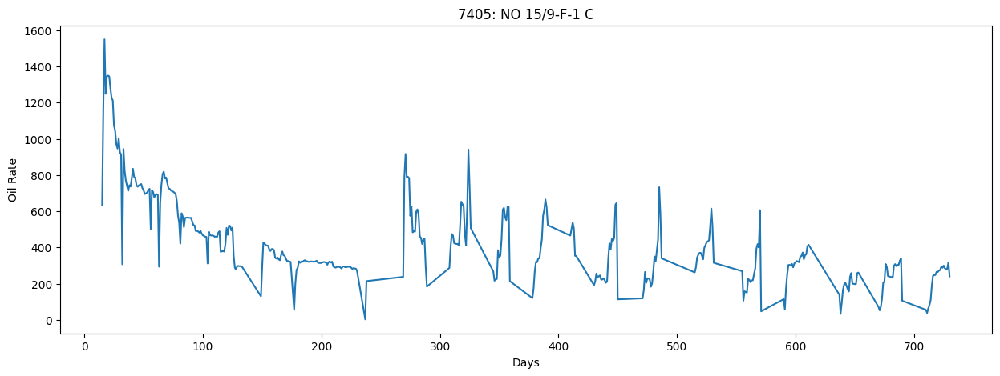

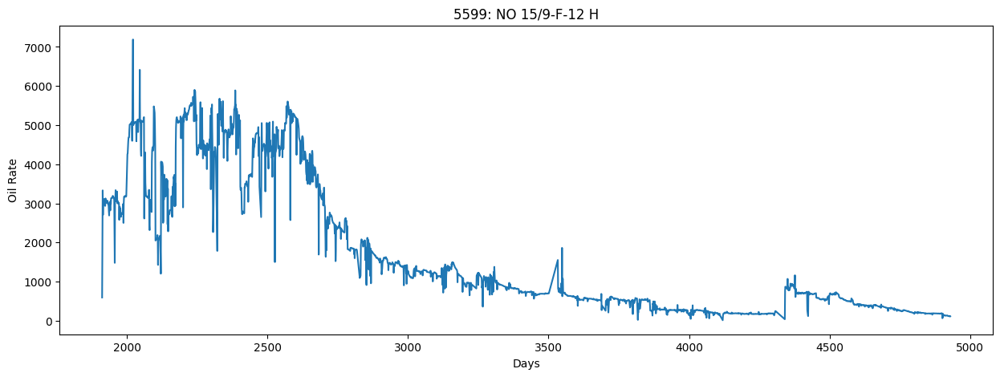

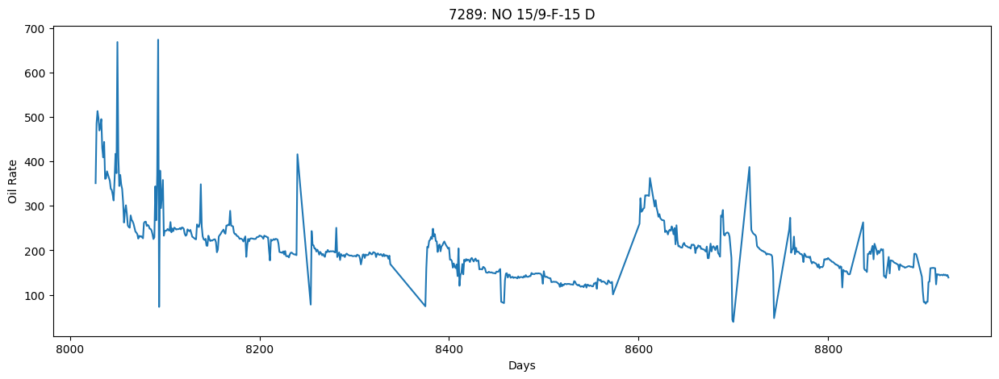

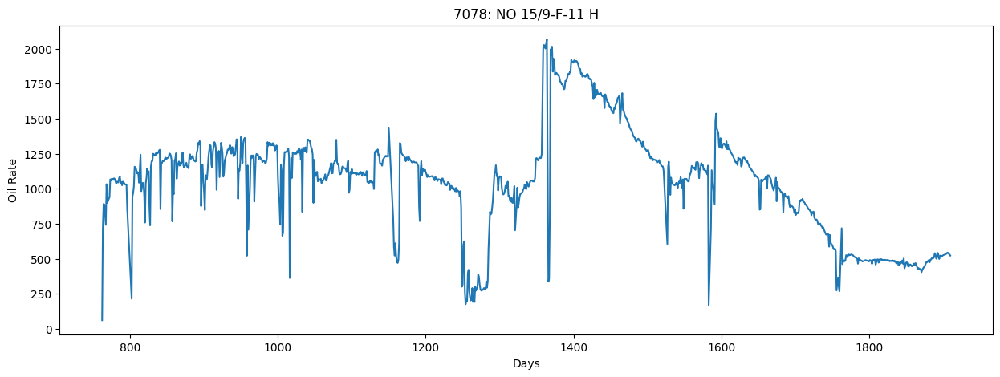

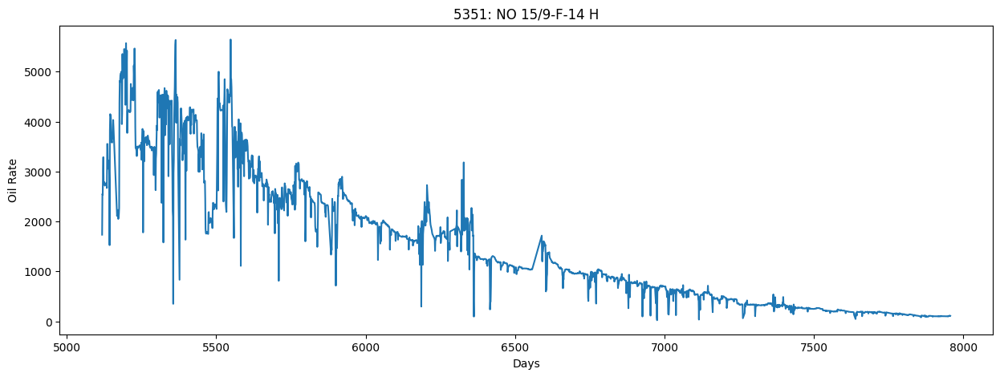

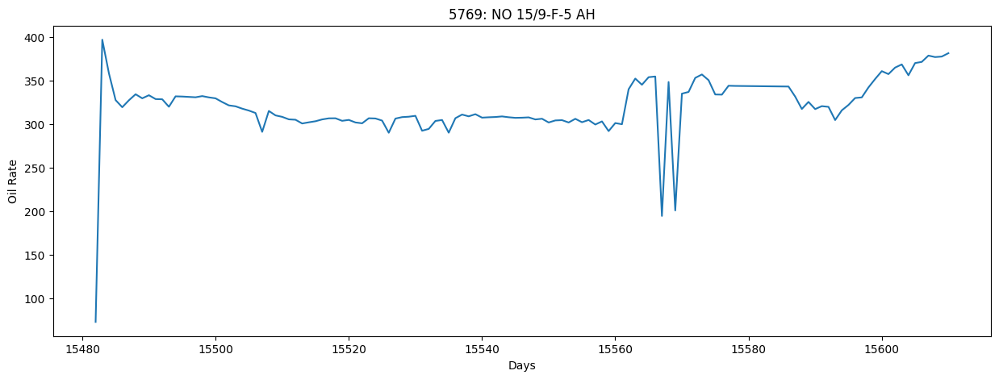

In [82]:
for i, j in well_info.items():
    plt.figure(figsize=(15,5))
    plt.title(f'{i}: {j}')
    plt.plot(df_active_producers[(df_active_producers.well_name==i)]['oil_rate']) # visualizing the oil rate over time per well
    plt.xlabel("Days")
    plt.ylabel("Oil Rate")
    plt.show()

Conclusion: Upon observation of the data, I immediately saw that there was a general decline in most of the wells over time, which makes sense due to the decline of the ability for the oil wells to extract these valuable resources. However, I also noticed massive spikes in the data that seemed extremely abnormal so an outlier detection system that can detect these anomalies and resolve them will be necessary.

## Statistical Breakdown & Clean Up

Objective: Analyze the numerical content of the dataset and fix any irregularities that are found.

Two statistical breakdowns were performed on the data. The first one was to merely observe any inconsistencies or any any issues that can be found by seeing a general overview of the numerical values of the data and the second one was to see a closer focus on the actual numbers of the data and seeing any trends or anything that could be of importance.

In [83]:
df_active_producers.describe().round() # looking at stats of data

,well_name,NPD_FIELD_CODE,NPD_FACILITY_CODE,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,BORE_WI_VOL,oil_rate
count,7987.0,7987.0,7987.0,7987.0,7851.0,7851.0,7851.0,7046.0,7987.0,7984.0,7984.0,7984.0,7987.0,7987.0,7987.0,0.0,7987.0
mean,5984.0,3420717.0,369304.0,23.0,182.0,79.0,154.0,16.0,61.0,45.0,76.0,16.0,1256.0,184631.0,1918.0,NaN,1300.0
std,793.0,0.0,0.0,3.0,105.0,45.0,71.0,8.0,34.0,19.0,18.0,17.0,1345.0,190400.0,1694.0,NaN,1363.0
min,5351.0,3420717.0,369304.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,183.0,-14.0,NaN,3.0
25%,5351.0,3420717.0,369304.0,24.0,197.0,99.0,149.0,13.0,34.0,32.0,71.0,3.0,272.0,42241.0,171.0,NaN,288.0
50%,5599.0,3420717.0,369304.0,24.0,230.0,105.0,176.0,18.0,59.0,38.0,82.0,9.0,718.0,111703.0,1493.0,NaN,783.0
75%,7078.0,3420717.0,369304.0,24.0,252.0,106.0,204.0,22.0,100.0,55.0,88.0,24.0,1660.0,251754.0,3413.0,NaN,1727.0
max,7405.0,3420717.0,369304.0,25.0,308.0,109.0,259.0,30.0,100.0,121.0,94.0,92.0,5902.0,851132.0,8020.0,NaN,7190.0


The first statistical breakdown showed me that one of the columns was completely filled with null and almost unusable so it was promptly filtered out. I also saw that some values were impossible so for example the water volume sometimes had negative values, percentages were sometimes greater than 100 and production hours sometimes exceeded 24 hours.

These were the checks done to ensure that my hypothesis was correct:

In [84]:
df_active_producers.isna().all() # checking which columns are completely null

date                     False
WELL_BORE_CODE           False
well_name                False
NPD_WELL_BORE_NAME       False
NPD_FIELD_CODE           False
NPD_FIELD_NAME           False
NPD_FACILITY_CODE        False
NPD_FACILITY_NAME        False
prod_hrs                 False
bhp                      False
bht                      False
dp_tubing                False
AVG_ANNULUS_PRESS        False
AVG_CHOKE_SIZE_P         False
AVG_CHOKE_UOM            False
whp                      False
wht                      False
choke_size_percentage    False
oil_vol                  False
gas_vol                  False
water_vol                False
BORE_WI_VOL               True
FLOW_KIND                False
well_type                False
oil_rate                 False
dtype: bool

In [85]:
df_active_producers[df_active_producers['water_vol'] < 0] # looking for invalid volume values seen from statistical breakdown

,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,BORE_WI_VOL,FLOW_KIND,well_type,oil_rate
1982,2008-04-23,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,24.0,260.557935,105.771069,168.697955,11.010635,31.487273,%,91.859980,73.584250,60.253108,2735.53,422115.01,-14.19,NaN,production,OP,2735.53
5350,2009-03-03,NO 15/9-F-14 H,5351,15/9-F-14,3420717,VOLVE,369304,MÆRSK INSPIRER,24.0,270.291285,105.463574,168.305082,NaN,33.576103,%,101.986203,79.554519,68.800869,4339.13,616094.56,-0.95,NaN,production,OP,4339.13


In [86]:
df_active_producers[df_active_producers['choke_size_percentage'] > 100] # looking for invalid % values seen from statistical breakdown

,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,BORE_WI_VOL,FLOW_KIND,well_type,oil_rate


In [87]:
df_active_producers[df_active_producers['prod_hrs'] > 24] # looking for invalid daily hour values seen from statistical breakdown

,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,BORE_WI_VOL,FLOW_KIND,well_type,oil_rate
202,2014-10-26,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,25.00000,220.957970,108.335850,184.403695,NaN,50.800396,%,36.554275,47.287813,7.917633,333.14,51384.55,336.05,NaN,production,OP,319.814400
856,2013-10-27,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,24.30839,256.047878,106.207083,173.834737,18.870834,10.388777,%,82.213141,60.017753,53.861978,1219.94,188361.38,69.99,NaN,production,OP,1204.463150
1218,2014-10-26,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,25.00000,220.578730,106.419528,167.636005,25.463593,11.425287,%,52.942725,63.461084,24.513722,1110.58,171297.30,339.89,NaN,production,OP,1066.156800
2166,2008-10-26,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,25.00000,233.664638,106.112080,163.381056,13.811904,47.944417,%,70.283581,75.273871,37.889267,3836.99,547535.29,12.84,NaN,production,OP,3683.510400
2527,2009-10-25,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,24.83333,261.865161,106.782569,184.307544,10.468965,51.153583,%,77.557616,75.845229,45.036169,4190.37,585516.23,279.62,NaN,production,OP,4049.754101
2891,2010-10-31,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,25.00000,0.000000,0.000000,52.641503,23.158358,53.118762,%,52.641503,88.527274,20.099256,1677.68,248776.29,3676.04,NaN,production,OP,1610.572800
3912,2013-10-27,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,24.14167,0.000000,0.000000,33.458990,14.795093,95.092071,%,33.458990,89.321837,4.623115,280.98,43383.87,4798.50,NaN,production,OP,279.331132
4274,2014-10-26,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,25.00000,0.000000,0.000000,32.822529,19.161930,100.000000,%,32.822529,87.203167,4.056984,187.27,28884.47,5004.00,NaN,production,OP,179.779200
5222,2008-10-26,NO 15/9-F-14 H,5351,15/9-F-14,3420717,VOLVE,369304,MÆRSK INSPIRER,25.00000,214.027703,105.109841,149.515311,NaN,43.486955,%,64.512391,78.139393,31.849241,4608.81,657672.80,1.54,NaN,production,OP,4424.457600
5583,2009-10-25,NO 15/9-F-14 H,5351,15/9-F-14,3420717,VOLVE,369304,MÆRSK INSPIRER,24.50000,241.828108,105.788536,173.394606,0.000000,39.832136,%,68.433502,81.802541,35.187547,3384.02,472845.45,1072.62,NaN,production,OP,3314.958367


Removing the completely null column:

In [88]:
if 'BORE_WI_VOL' in df_active_producers.columns:
    df_active_producers = df_active_producers = df_active_producers.drop('BORE_WI_VOL', axis=1) # cleaning dataset from issues found in statistical breakdown

Impossible values cannot be accounted for so the best possible solution I performed was interpolating the values but removing them is also a viable option as it will not have severe impact on data and will maintain data integrity.

In [89]:
# df_active_producers = df_active_producers[df_active_producers['water_vol'] >= 0]
# df_active_producers = df_active_producers[df_active_producers['choke_size_percentage'] <= 100]
# df_active_producers = df_active_producers[df_active_producers['prod_hrs'] <= 24]

df_active_producers['water_vol'] = np.where(df_active_producers['water_vol'] < 0, np.nan, df_active_producers['water_vol'])
df_active_producers['choke_size_percentage'] = np.where(df_active_producers['choke_size_percentage'] > 100, np.nan, df_active_producers['choke_size_percentage'])
df_active_producers['prod_hrs'] = np.where(df_active_producers['prod_hrs'] > 24, np.nan, df_active_producers['prod_hrs'])
df_active_producers['water_vol'] = df_active_producers['water_vol'].interpolate()
df_active_producers['choke_size_percentage'] = df_active_producers['choke_size_percentage'].interpolate()
df_active_producers['prod_hrs'] = df_active_producers['prod_hrs'].interpolate() # interpolating impossible values found in statistical breakdown

Moreover, some columns were observed to have some null values.

In [90]:
df_active_producers.isna().any() # checking which columns contain null values

date                     False
WELL_BORE_CODE           False
well_name                False
NPD_WELL_BORE_NAME       False
NPD_FIELD_CODE           False
NPD_FIELD_NAME           False
NPD_FACILITY_CODE        False
NPD_FACILITY_NAME        False
prod_hrs                 False
bhp                       True
bht                       True
dp_tubing                 True
AVG_ANNULUS_PRESS         True
AVG_CHOKE_SIZE_P         False
AVG_CHOKE_UOM            False
whp                       True
wht                       True
choke_size_percentage    False
oil_vol                  False
gas_vol                  False
water_vol                False
FLOW_KIND                False
well_type                False
oil_rate                 False
dtype: bool

In [91]:
df_active_producers[df_active_producers.isna().any(axis=1)] # looking at rows with any null values in them

,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,FLOW_KIND,well_type,oil_rate
16,2014-04-23,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,270.239793,107.643779,171.052782,NaN,47.167523,%,99.187011,60.756579,70.627109,1166.46,165720.39,0.00,production,OP,1166.460000
17,2014-04-24,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,262.842747,107.869234,168.241977,NaN,47.732310,%,94.600770,63.046800,66.049151,1549.81,221707.31,0.00,production,OP,1549.810000
18,2014-04-25,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,255.526995,107.971137,165.538903,NaN,48.533769,%,89.988092,64.547229,61.405386,1248.70,178063.52,0.00,production,OP,1248.700000
19,2014-04-26,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,247.199052,108.052030,162.422242,NaN,49.844502,%,84.776810,65.723694,56.147906,1345.78,192602.19,0.00,production,OP,1345.780000
20,2014-04-27,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,240.736417,108.053804,159.899020,NaN,50.296982,%,80.837397,66.933732,52.201747,1349.56,194496.27,0.00,production,OP,1349.560000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15606,2016-08-22,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,24.998372,100.000000,%,23.650190,57.479738,0.119955,371.33,57934.84,90.61,production,OP,371.330000
15607,2016-08-23,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,25.073654,100.000000,%,23.728094,56.861513,0.190029,378.55,59119.57,90.11,production,OP,378.550000
15608,2016-08-24,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,24.933768,100.000000,%,23.703260,56.248741,0.167719,376.86,58632.31,91.32,production,OP,376.860000
15609,2016-08-25,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,24.930640,100.000000,%,23.641755,57.883541,0.102264,377.44,59337.43,91.38,production,OP,377.440000


The amount of rows possessing null values was actually a significant amount almost 1000 rows of the approximately 8000 row data set so removing these rows seemed unrealistic. The null values usually appeared in specific columns in the data and it will be it will seem clear after we progress through this EDA the source of this issue.

A strictly numerous static statistical breakdown was done performed, which was used to observe some of the values and perform further statistical observations, interesting of value.

In [92]:
df_active_producers_numeric = df_active_producers.select_dtypes(include=[np.number]).drop(["NPD_FIELD_CODE", "well_name", "NPD_FACILITY_CODE"], axis=1) # filter non-numeric columns and well identification columns
df_active_producers_numeric

,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,oil_rate
15,24.00000,289.421362,106.353209,182.059312,0.000000,43.343451,107.362050,37.939251,78.935409,631.47,90439.09,0.00,631.470000
16,24.00000,270.239793,107.643779,171.052782,NaN,47.167523,99.187011,60.756579,70.627109,1166.46,165720.39,0.00,1166.460000
17,24.00000,262.842747,107.869234,168.241977,NaN,47.732310,94.600770,63.046800,66.049151,1549.81,221707.31,0.00,1549.810000
18,24.00000,255.526995,107.971137,165.538903,NaN,48.533769,89.988092,64.547229,61.405386,1248.70,178063.52,0.00,1248.700000
19,24.00000,247.199052,108.052030,162.422242,NaN,49.844502,84.776810,65.723694,56.147906,1345.78,192602.19,0.00,1345.780000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15606,24.00000,NaN,NaN,NaN,24.998372,100.000000,23.650190,57.479738,0.119955,371.33,57934.84,90.61,371.330000
15607,24.00000,NaN,NaN,NaN,25.073654,100.000000,23.728094,56.861513,0.190029,378.55,59119.57,90.11,378.550000
15608,24.00000,NaN,NaN,NaN,24.933768,100.000000,23.703260,56.248741,0.167719,376.86,58632.31,91.32,376.860000
15609,24.00000,NaN,NaN,NaN,24.930640,100.000000,23.641755,57.883541,0.102264,377.44,59337.43,91.38,377.440000


In [93]:
df_active_producers_numeric.describe().round() # looking at stats of numeric data

,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,oil_rate
count,7987.0,7851.0,7851.0,7851.0,7046.0,7987.0,7984.0,7984.0,7987.0,7987.0,7987.0,7987.0,7987.0
mean,23.0,182.0,79.0,154.0,16.0,61.0,45.0,76.0,16.0,1256.0,184631.0,1918.0,1300.0
std,3.0,105.0,45.0,71.0,8.0,34.0,19.0,18.0,17.0,1345.0,190400.0,1694.0,1363.0
min,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,183.0,0.0,3.0
25%,24.0,197.0,99.0,149.0,13.0,34.0,32.0,71.0,3.0,272.0,42241.0,171.0,288.0
50%,24.0,230.0,105.0,176.0,18.0,59.0,38.0,82.0,9.0,718.0,111703.0,1493.0,783.0
75%,24.0,252.0,106.0,204.0,22.0,100.0,55.0,88.0,24.0,1660.0,251754.0,3413.0,1727.0
max,24.0,308.0,109.0,259.0,30.0,100.0,121.0,94.0,92.0,5902.0,851132.0,8020.0,7190.0


Interesting points that I saw was that the gas volume can get particularly high and due to my due to my limited knowledge in this domain, I am not exactly sure on how to manage this inconsistency. However, I was informed by my supervisor that this is relatively fine.

In [94]:
df_active_producers_numeric.describe().round()['gas_vol']

count      7987.0
mean     184631.0
std      190400.0
min         183.0
25%       42241.0
50%      111703.0
75%      251754.0
max      851132.0
Name: gas_vol, dtype: float64

In [95]:
df_active_producers = df_active_producers.reset_index()
if 'level_0' in df_active_producers.columns:
    df_active_producers = df_active_producers.drop('level_0', axis=1)
if 'index' in df_active_producers.columns:
    df_active_producers = df_active_producers.drop('index', axis=1)
df_active_producers # resetting index of dataset as some rows have been removed

,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,FLOW_KIND,well_type,oil_rate
0,2014-04-22,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,289.421362,106.353209,182.059312,0.000000,43.343451,%,107.362050,37.939251,78.935409,631.47,90439.09,0.00,production,OP,631.470000
1,2014-04-23,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,270.239793,107.643779,171.052782,NaN,47.167523,%,99.187011,60.756579,70.627109,1166.46,165720.39,0.00,production,OP,1166.460000
2,2014-04-24,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,262.842747,107.869234,168.241977,NaN,47.732310,%,94.600770,63.046800,66.049151,1549.81,221707.31,0.00,production,OP,1549.810000
3,2014-04-25,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,255.526995,107.971137,165.538903,NaN,48.533769,%,89.988092,64.547229,61.405386,1248.70,178063.52,0.00,production,OP,1248.700000
4,2014-04-26,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,247.199052,108.052030,162.422242,NaN,49.844502,%,84.776810,65.723694,56.147906,1345.78,192602.19,0.00,production,OP,1345.780000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,2016-08-22,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,24.998372,100.000000,%,23.650190,57.479738,0.119955,371.33,57934.84,90.61,production,OP,371.330000
7983,2016-08-23,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,25.073654,100.000000,%,23.728094,56.861513,0.190029,378.55,59119.57,90.11,production,OP,378.550000
7984,2016-08-24,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,24.933768,100.000000,%,23.703260,56.248741,0.167719,376.86,58632.31,91.32,production,OP,376.860000
7985,2016-08-25,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,NaN,NaN,NaN,24.930640,100.000000,%,23.641755,57.883541,0.102264,377.44,59337.43,91.38,production,OP,377.440000


Conclusion: This section performed two statistical breakdowns. The first established the major holes in the data and any logical inconsistencies that are present in the data so it can be handled. The second statistical breakdown allowed me to analyze the numerical distirbutions of the data, which seem relatively fine but provide some extra background information.

## Outlier Detection & Clean Up

Objective: This section is intended to build a reliable outlier detection and removal/fix system where outliers are precisely handled.

Note: I was told by my supervisor that oil and gas is a conservative field where anomalies can occur from from a large amount of factors so removing anomalies should be done very carefully and conservation in mind. Thus, I built an flag system to detect and remove outliers by detecting values that are both outside the normal distribution of the values which would show that that the value is generally an anomaly in the distribution as well as outside the gradient distribution, which shows that it saw a large enough change to be considered abnormal. Values were only considered consider as outliers if they met both conditions.

In [96]:
df_active_producers_outliers = df_active_producers.copy(deep=True)
df_active_producers_outliers[['z_score_outlier', 'gradient_outlier', 'consecutive_gradient_outlier', 'outlier']] = False # creating outlier columns that will be needed to identify if a row of data counts as outlier

In [97]:
z_score_flag = 4
gradient_flag = 3
consecutive_gradient_flag = 3 # adjustable normal distirbution values that are used as outlier classification boundary lines

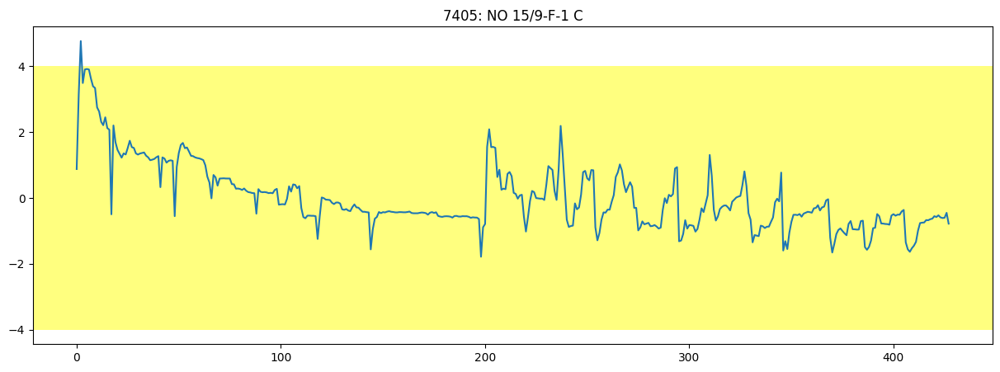

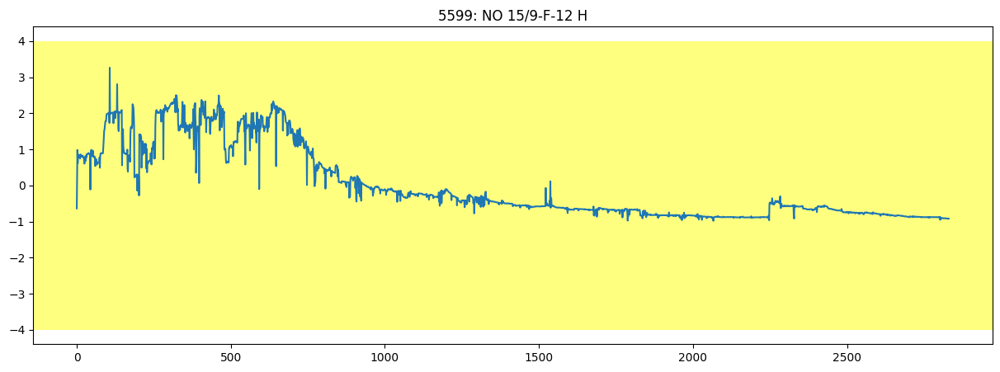

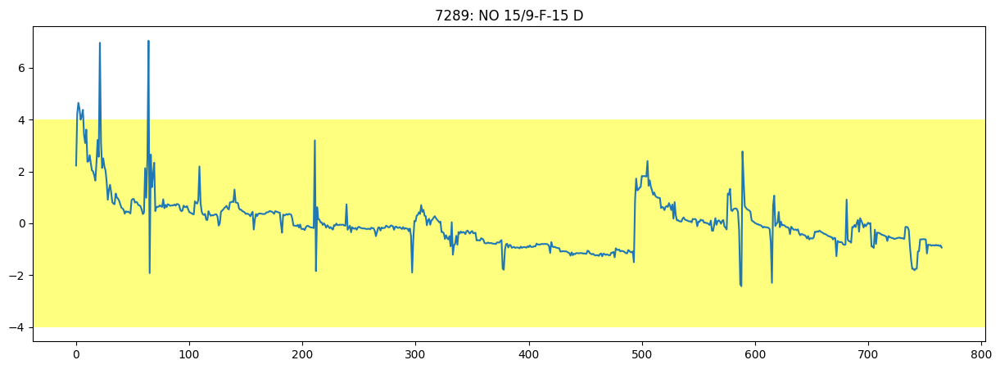

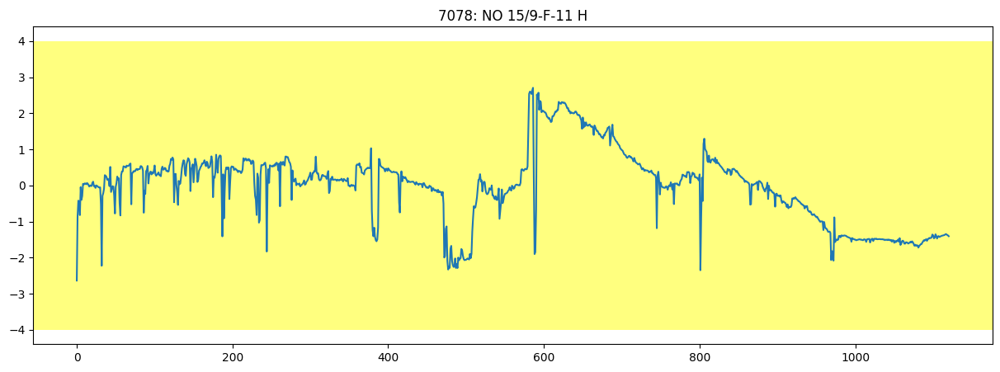

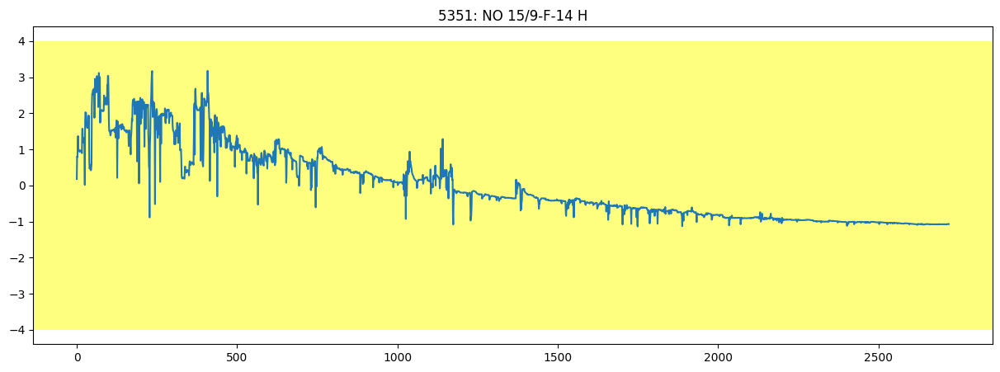

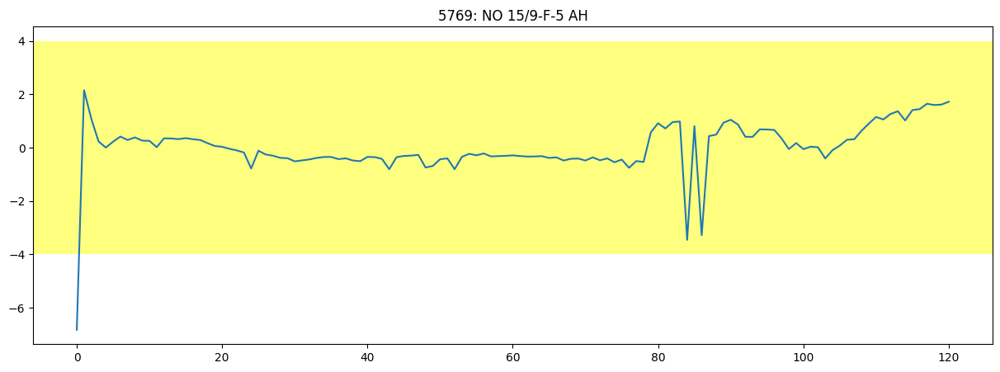

In [98]:
for i, j in well_info.items():
    plt.figure(figsize=(15,5))
    plt.title(f'{i}: {j}')
    well = df_active_producers_outliers[(df_active_producers_outliers.well_name==i)]['oil_rate'] # retriving oil rate values per well
    z_score = (well - well.mean()) / well.std() # creating normal distirbution of values
    z_score_outlier_check = (z_score > z_score_flag) | (z_score < -z_score_flag) # checking if values are outside set boundaries
    df_active_producers_outliers.loc[(df_active_producers_outliers.well_name==i), 'z_score_outlier'] = z_score_outlier_check # if values are outside usual boundaries, classofy as outlier
    plt.plot(z_score.reset_index()['oil_rate'])
    plt.axhspan(-z_score_flag, z_score_flag, facecolor='yellow', alpha=0.5)
    plt.show() # visualization of process

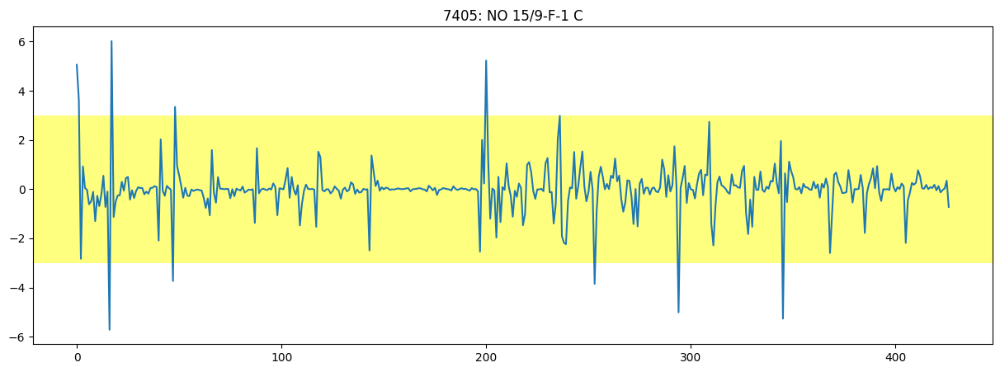

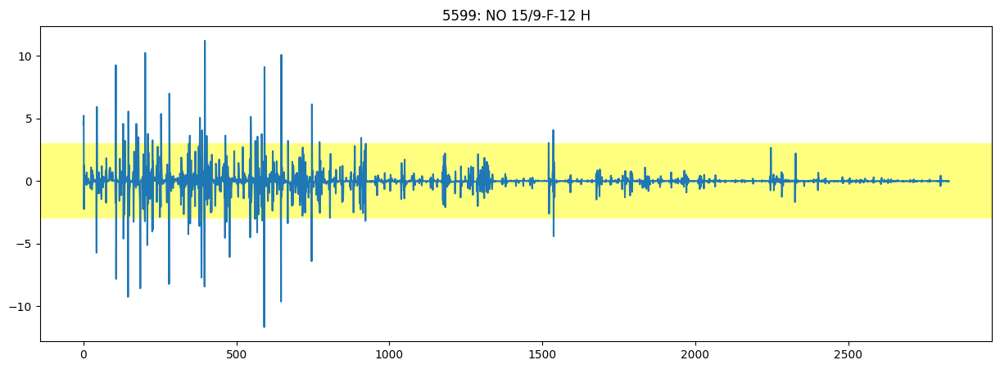

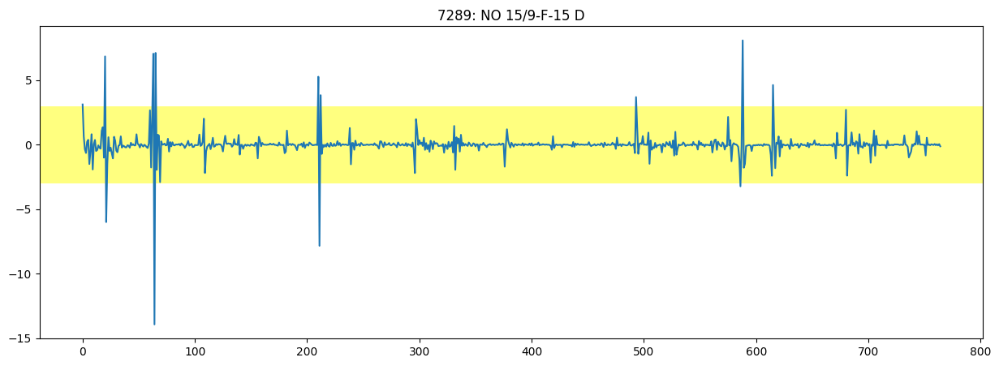

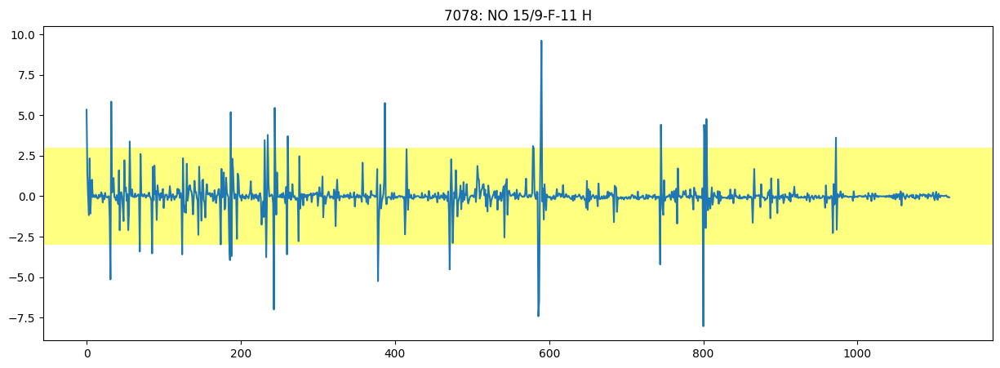

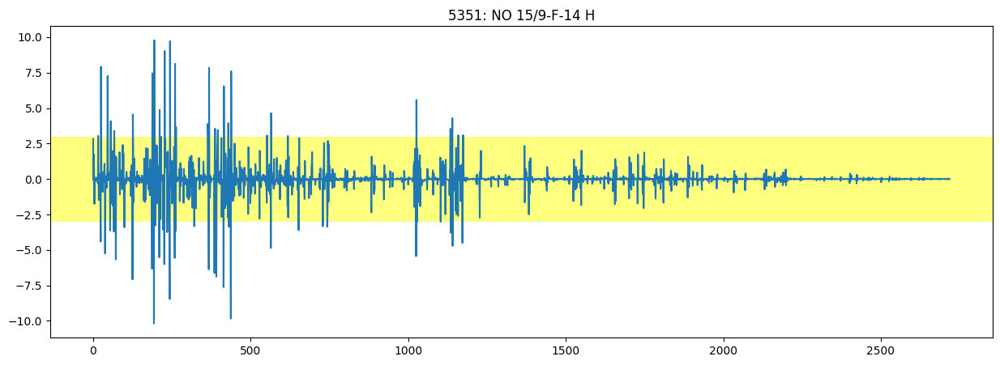

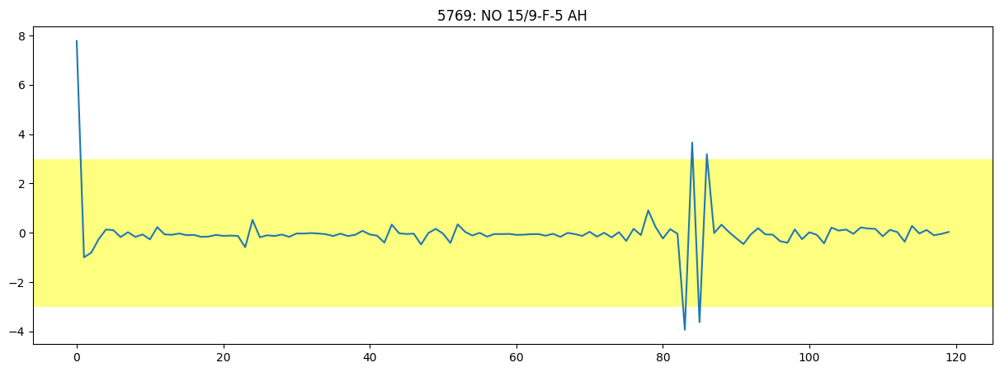

In [99]:
for i, j in well_info.items():
    plt.figure(figsize=(15,5))
    plt.title(f'{i}: {j}')
    well = df_active_producers_outliers[(df_active_producers_outliers.well_name==i)]['oil_rate'].diff().shift(-1) # retriving gradient of oil rate values/oil rate value changes per well
    z_score = (well - well.mean()) / well.std() # creating normal distirbution of gradient values
    gradient_outlier_check = (z_score > gradient_flag) | (z_score < -gradient_flag) # checking if values are outside set boundaries
    df_active_producers_outliers.loc[(df_active_producers_outliers.well_name==i), 'gradient_outlier'] = gradient_outlier_check # if values are outside usual boundaries, classofy as outlier
    plt.plot(z_score.reset_index()['oil_rate'])
    plt.axhspan(-gradient_flag, gradient_flag, facecolor='yellow', alpha=0.5)
    plt.show() # visualization of process

However, even after the initial clean up, I saw the data had massive deviations in them that could be slightly cleaned up, so I added an extra condition that if two consecutive gradient shifts were large enough, but also opposite directions, it would show that the data generally spike at one point and came right back to its original position or equivalent.

TypeError: infer_objects() got an unexpected keyword argument 'copy'

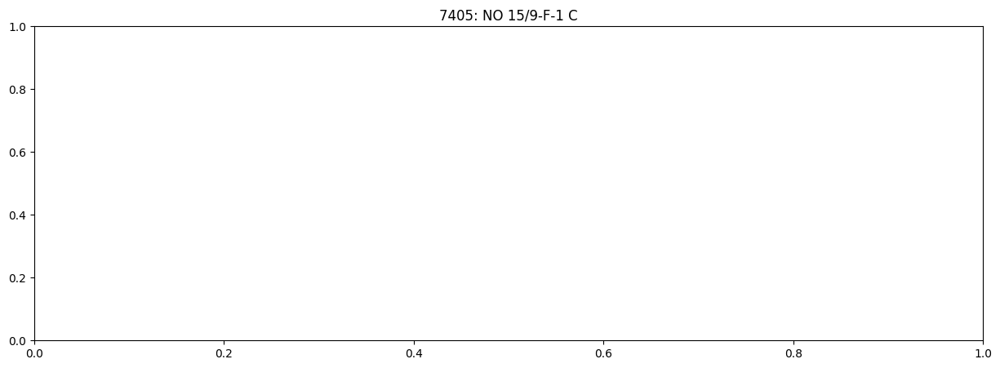

In [101]:
for i, j in well_info.items():
    plt.figure(figsize=(15,5))
    plt.title(f'{i}: {j}')
    well = df_active_producers_outliers[(df_active_producers_outliers.well_name==i)]['oil_rate'].diff().shift(-1) # retriving gradient of oil rate values/oil rate value changes per well
    well_next = well.shift(-1)
    z_score = (well - well.mean()) / well.std() # creating normal distirbution of gradient values
    z_score_next = (well_next - well.mean()) / well.std() # creating normal distirbution of gradient values
    consecutive_gradient_outlier_check = (z_score.abs() > consecutive_gradient_flag) & (z_score_next.abs() > consecutive_gradient_flag) & (well * well_next < 0) # checking both of the consecutive gradients violate the flag and that they are in opposite directions
    consecutive_gradient_outlier_check_shifted = consecutive_gradient_outlier_check.shift(1).infer_objects(copy=False).astype(bool)
    df_active_producers_outliers.loc[(df_active_producers_outliers.well_name==i), 'consecutive_gradient_outlier'] = consecutive_gradient_outlier_check_shifted # if values are outside usual boundaries, classofy as outlier
    outlier_indices = df_active_producers_outliers[(df_active_producers_outliers['consecutive_gradient_outlier'] == True) & (df_active_producers_outliers.well_name==i)].index # labeling rows as outliers if conditions match
    plt.plot(df_active_producers_outliers[(df_active_producers_outliers.well_name==i)]['oil_rate'])
    plt.scatter(outlier_indices, df_active_producers_outliers[(df_active_producers_outliers.well_name==i)].loc[outlier_indices, 'oil_rate'], color='red', marker='x', label='Outliers')
    plt.show() # visualization of process

In [102]:
df_active_producers_outliers['outlier'] = (df_active_producers_outliers['z_score_outlier'] & df_active_producers_outliers['gradient_outlier']) | df_active_producers_outliers['consecutive_gradient_outlier'] # classifying outliers as values that both violate the normal distibrution boundary value and the gradient normal distirbution value

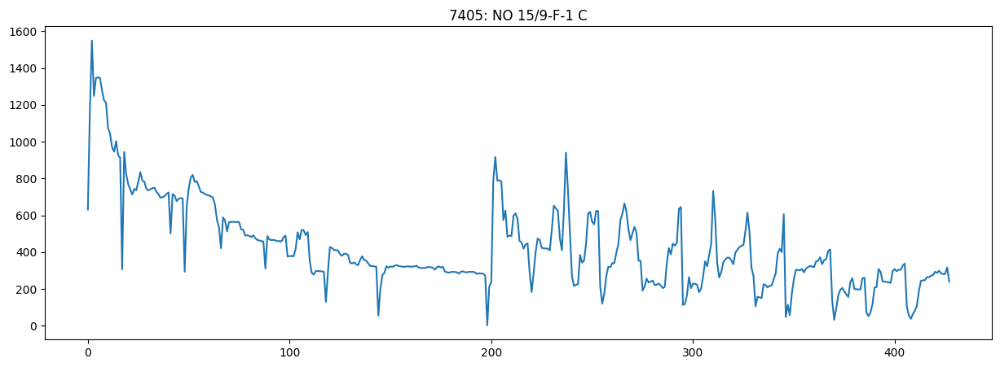

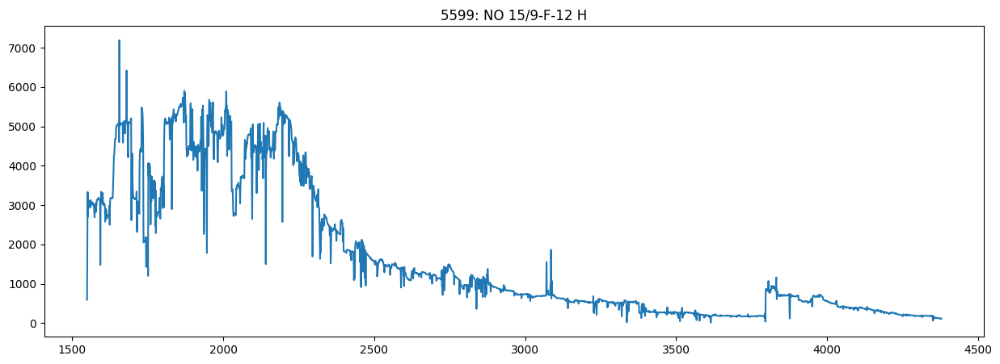

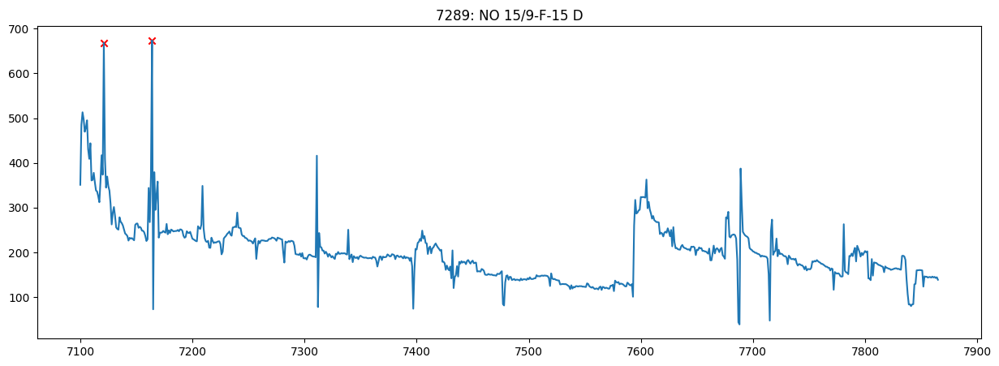

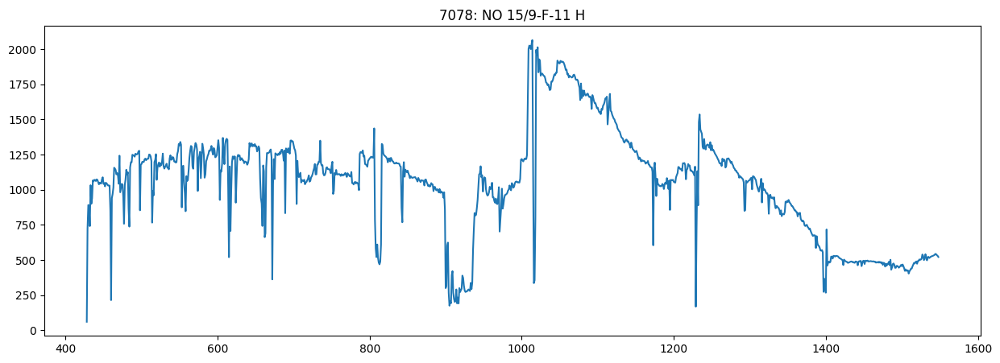

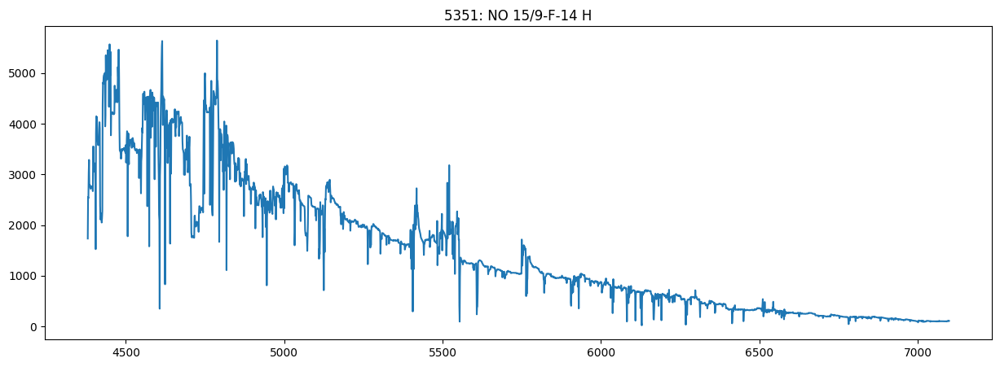

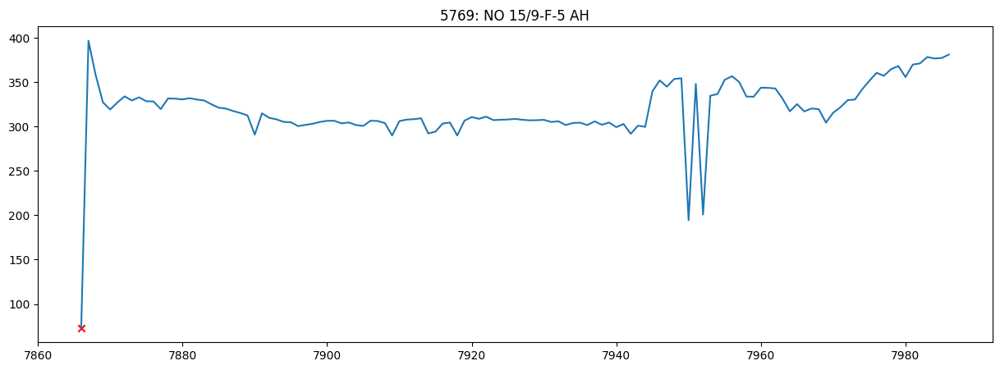

In [103]:
for i, j in well_info.items():
    plt.figure(figsize=(15,5))
    plt.title(f'{i}: {j}')
    well = df_active_producers_outliers[(df_active_producers_outliers.well_name==i)]
    outlier_indices = well[well['outlier'] == True]['outlier'].index # labeling rows as outliers if conditions match
    plt.plot(well['oil_rate'])
    plt.scatter(outlier_indices, well.loc[outlier_indices, 'oil_rate'], color='red', marker='x', label='Outliers')
    plt.show() # visualizing outliers

Removing these outliers is a possible viable option, however, I decided to interpolate these values to further improve the time series values.

In [104]:
df_active_producers['oil_rate'] = np.where(df_active_producers_outliers['outlier'], np.nan, df_active_producers['oil_rate'])
df_active_producers['oil_rate'] = df_active_producers['oil_rate'].interpolate() # interpolating outliers
if pd.isna(df_active_producers['oil_rate'].iloc[0]):
    df_active_producers.loc[0, 'oil_rate'] = df_active_producers.loc[1, 'oil_rate']

experiment with flags and add which flags caught which outliers

In [105]:
print(f"For hyperparameters:\nNormal Distirbution Flag = {z_score_flag}\nGradient Change Flag = {gradient_flag}\nConsecutive Opposite Gradient Flag = {consecutive_gradient_flag}\n")
print(f"The number of values labeled as outliers are {len(df_active_producers_outliers[df_active_producers_outliers['outlier'] == True])} and the cumulative difference after interpolation is {np.abs(df_active_producers_outliers['oil_rate'] - df_active_producers['oil_rate']).sum():.2f}")

For hyperparameters:
Normal Distirbution Flag = 4
Gradient Change Flag = 3
Consecutive Opposite Gradient Flag = 3

The number of values labeled as outliers are 3 and the cumulative difference after interpolation is 924.25


Alternative option for outlier detection can be using a rolling window. Not currently being implemented into the outlier detection system but can be used.

try a median filter

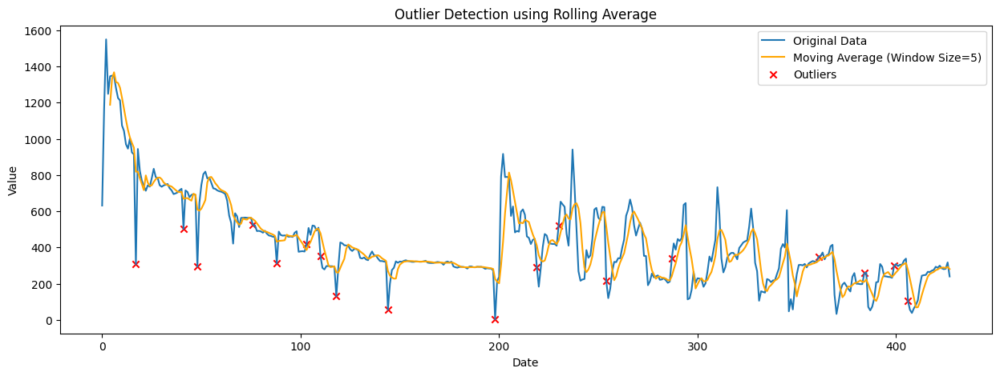

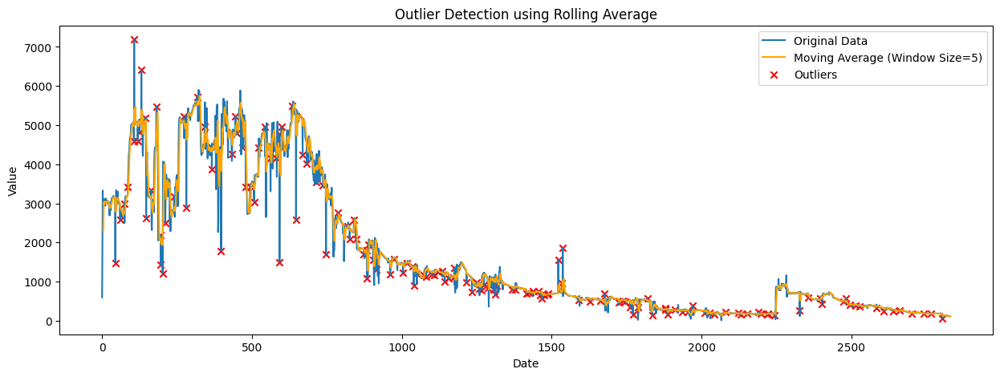

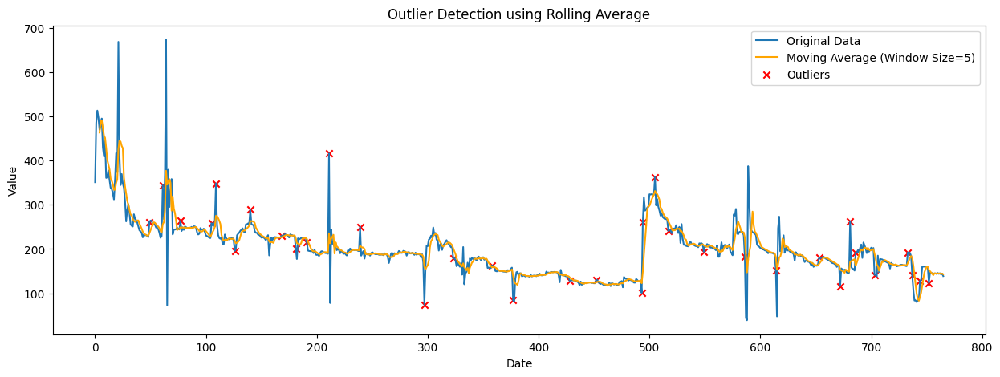

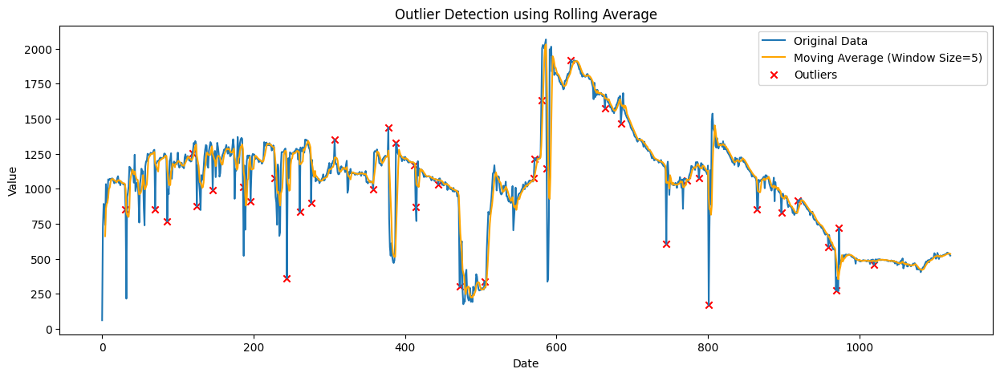

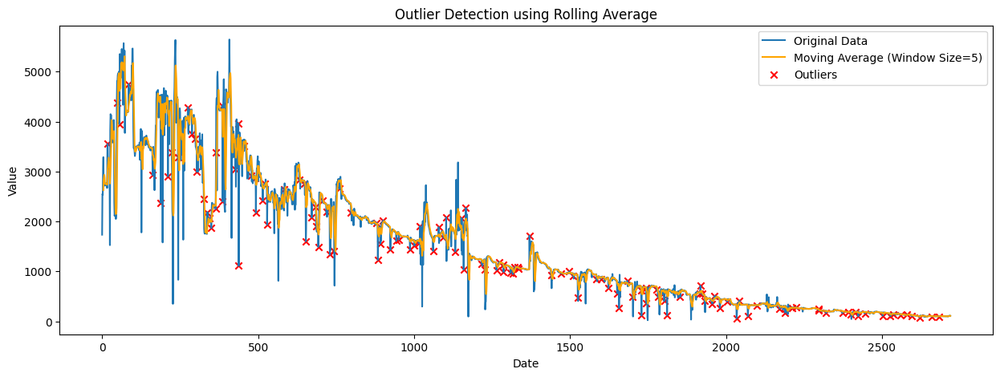

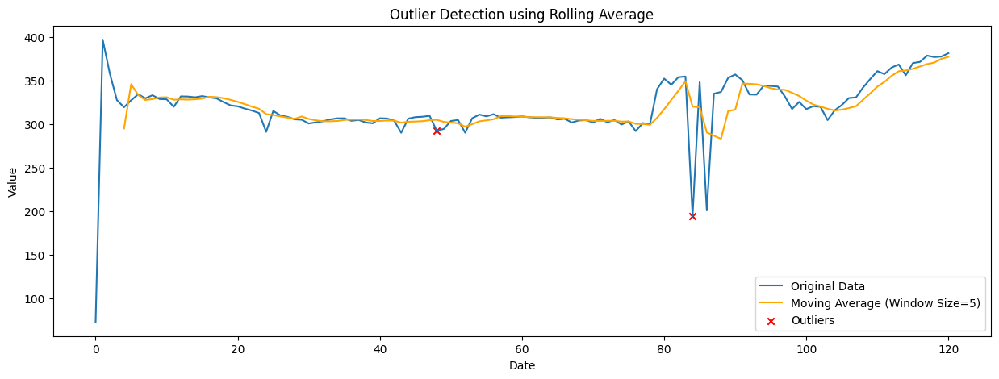

In [106]:
threshold = 1.75
# window_pct = 0.05
df_active_producers_outliers['rolling_mean'] = 0
df_active_producers_outliers['rolling_std'] = 0
df_active_producers_outliers['window_outlier'] = False
for i, j in well_info.items():
    window_size = 5 # int(len(well) * window_pct)
    well = df_active_producers_outliers[(df_active_producers_outliers.well_name==i)].reset_index()
    well['rolling_mean'] = well['oil_rate'].rolling(window=window_size).mean()
    well['rolling_std'] = well['oil_rate'].rolling(window=window_size).std()
    well['window_outlier'] = np.abs((well['oil_rate'] - well['rolling_mean']) / well['rolling_std']) > threshold # normally distirbuting values to compare to flag
    plt.figure(figsize=(15, 5))
    plt.plot(well.index, well['oil_rate'], label='Original Data')
    plt.plot(well.index, well['rolling_mean'], label=f'Moving Average (Window Size={window_size})', color='orange') # showing the moving average line
    plt.scatter(well.index[well['window_outlier']], well['oil_rate'][well['window_outlier']], color='red', label='Outliers', marker='x') # visually labeling outliers
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.title('Outlier Detection using Rolling Average')
    plt.show() # visualization of process

Conclusion: This section effectively marked outliers, visualized it so it can be assessed and handles them by interpolating the values.

## Visualization After Cleaning

Objective: This section is simply intended to visualize the graphs after cleaning so the difference can be compared and check that the data has been cleaned or abnormal behavior.

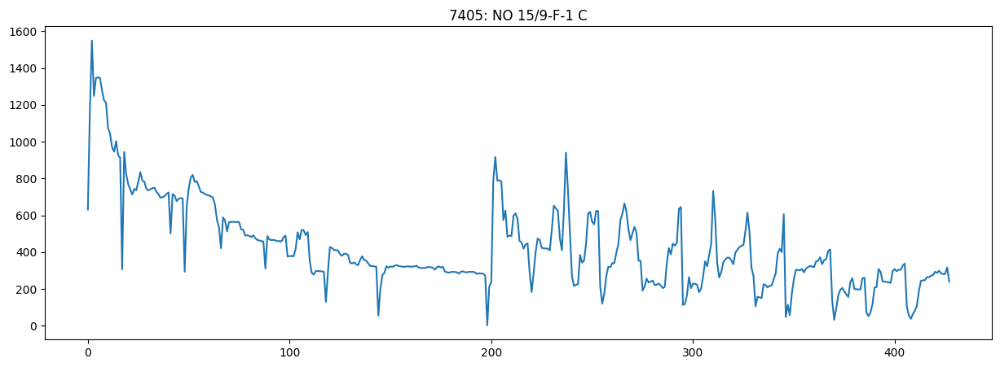

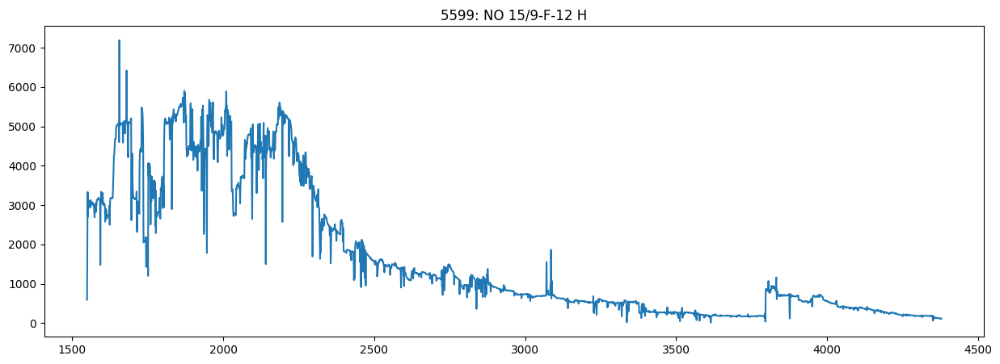

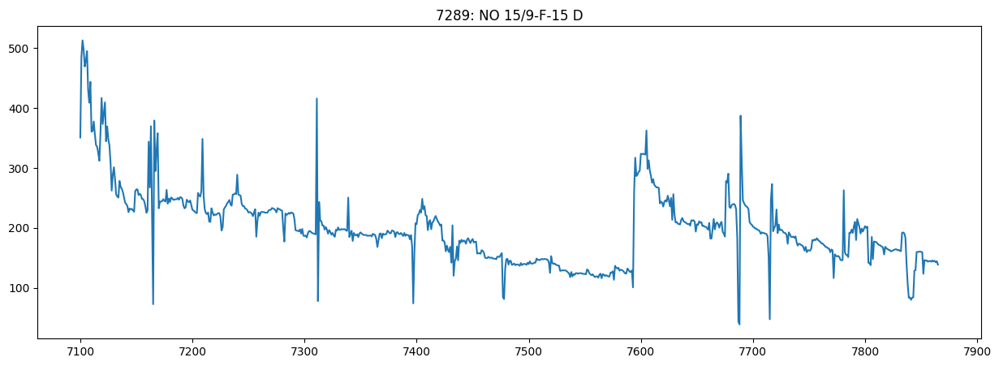

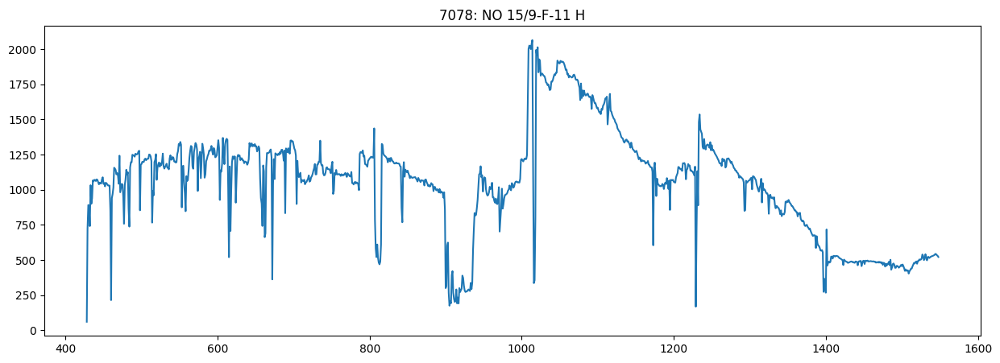

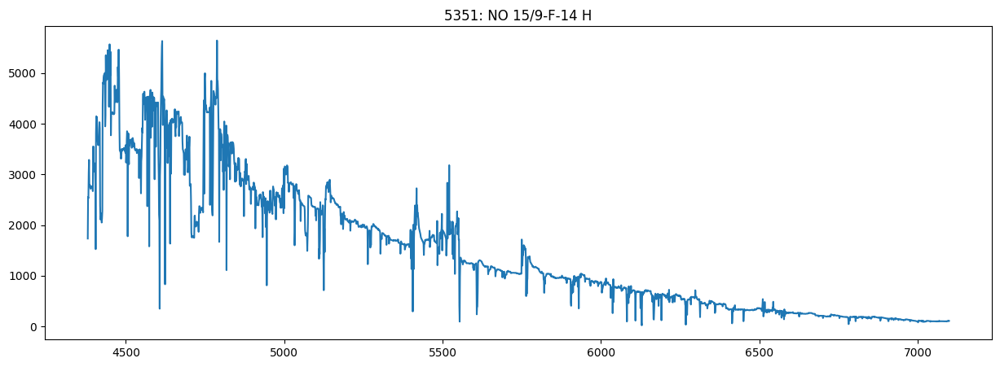

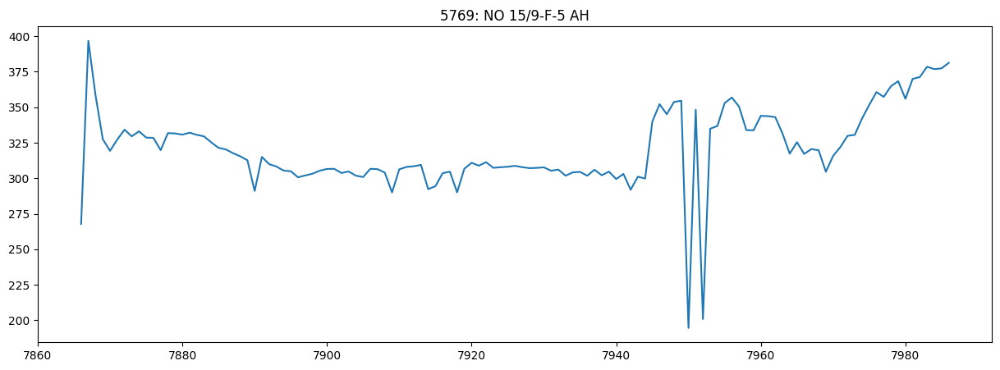

In [107]:
for i, j in well_info.items():
    plt.figure(figsize=(15,5))
    plt.title(f'{i}: {j}')
    plt.plot(df_active_producers[(df_active_producers.well_name==i)]['oil_rate'])
    plt.show() # displaying new graphs with interpolated values

							 Oil Rate Comparison Before & After Cleanup Per Well


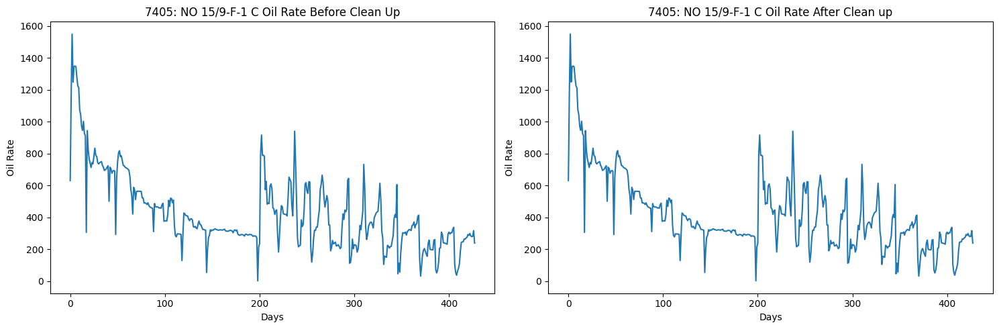

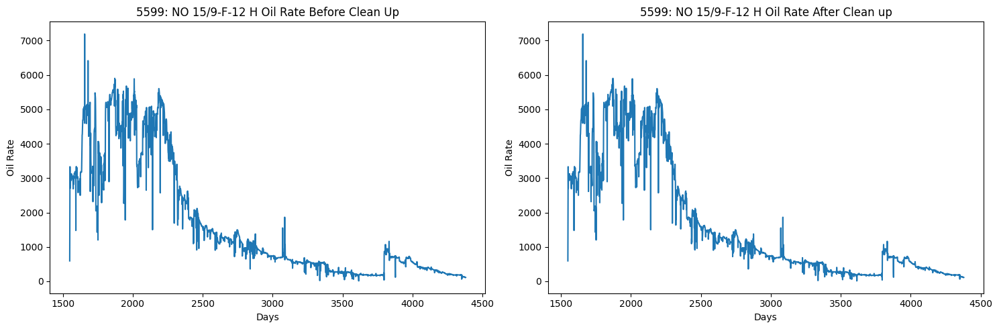

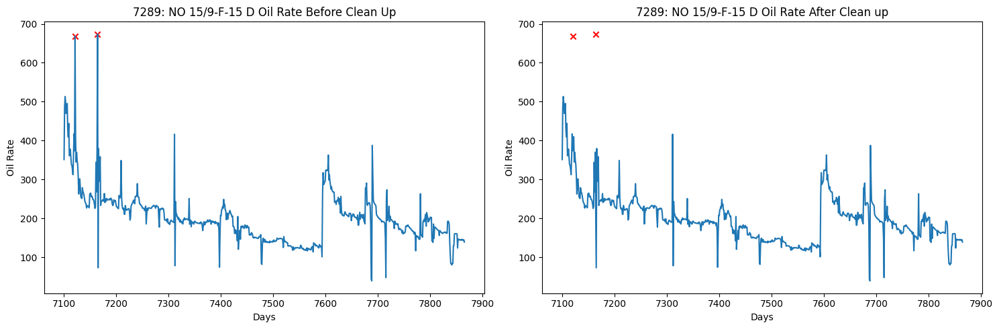

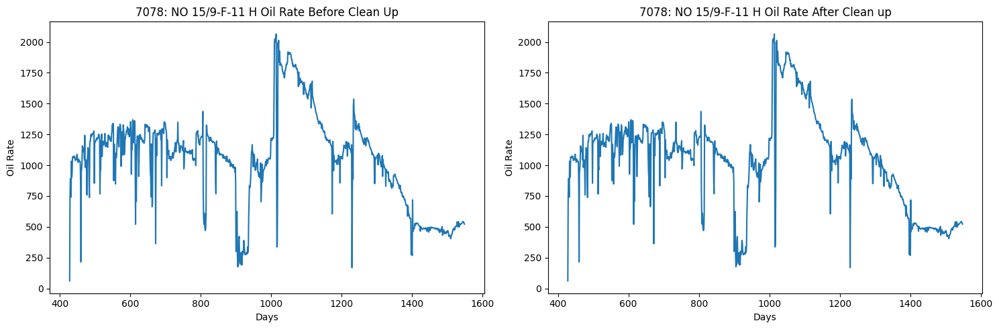

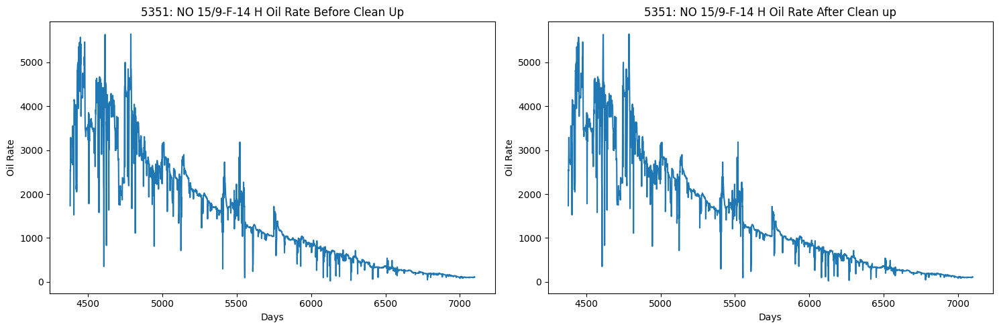

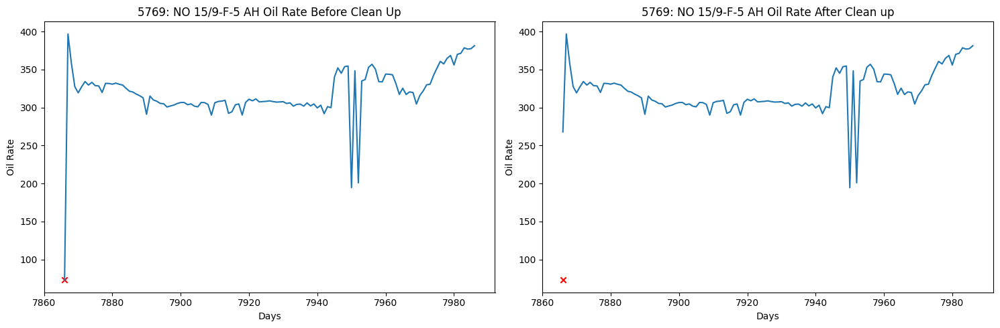

In [108]:
print("\t" * 7, "Oil Rate Comparison Before & After Cleanup Per Well")
for i, j in well_info.items():
    plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    plt.title(f'{i}: {j} Oil Rate Before Clean Up')
    well_before = df_active_producers_outliers[(df_active_producers_outliers.well_name==i)]
    outlier_indices = well_before[well_before['outlier'] == True]['outlier'].index
    plt.scatter(outlier_indices, well_before.loc[outlier_indices, 'oil_rate'], color='red', marker='x', label='Outliers')
    plt.plot(well_before['oil_rate'])
    plt.xlabel("Days")
    plt.ylabel("Oil Rate")
    plt.subplot(1, 2, 2)
    plt.title(f'{i}: {j} Oil Rate After Clean up')
    plt.plot(df_active_producers[(df_active_producers.well_name==i)]['oil_rate'])
    plt.scatter(outlier_indices, well_before.loc[outlier_indices, 'oil_rate'], color='red', marker='x', label='Outliers')
    plt.xlabel("Days")
    plt.ylabel("Oil Rate")
    plt.tight_layout()
    plt.show()

In [109]:
print("\t" * 8, "3D Plots of Choke % & Oil Rate Over Time")
for i, j in well_info.items():
    well_data = df_active_producers[df_active_producers.well_name == i]
    x = list(range(len(well_data)))
    y = well_data['choke_size_percentage']
    z = well_data['oil_rate']
    fig = go.Figure(data=[go.Scatter3d(x=x, y=y, z=z, mode='lines', line=dict(width=2, color='blue'))])
    fig.update_layout(
        title=f'\nFOR {i}: {j}',
        scene=dict(
            xaxis_title='Days',
            yaxis_title='Choke Size %',
            zaxis_title='Oil Rate'
        ),
        width=1200,
        height=1200
    )
    fig.show()

								 3D Plots of Choke % & Oil Rate Over Time


Conclusion: This section intended to both showcase the difference between before outlier smoothing and after as well as showing some interesting behavior of the data.

## Detailed Dataset Analysis

Objective: This section is intended to analyze the dataset closely to view patterns and useful information in the global view of the dataset

A correlation matrix was performed to see how features correlate with each other, which can provide us beneficial information on important features that can be used in the models to produce reliable outputs for the important values.

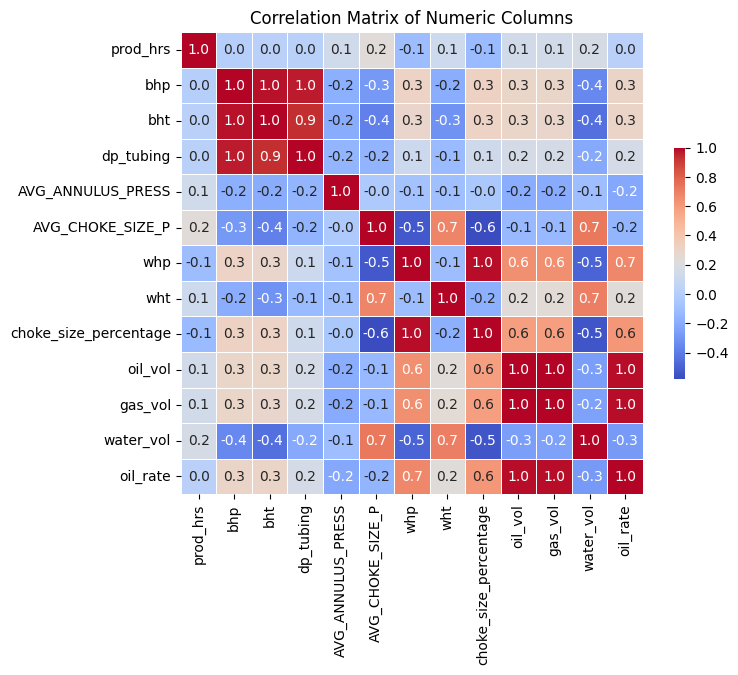

In [110]:
correlation_matrix = df_active_producers_numeric.corr() # compute the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt=".1f", cmap='coolwarm', square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title('Correlation Matrix of Numeric Columns')
plt.show() # plotting the correlation matrix

Concentrating on the important correlations which are the resources rates/volumes:

In [111]:
for i in ['oil_rate', 'oil_vol', 'gas_vol', 'water_vol']:
    print("Correlation values for", i)
    print(correlation_matrix[i].sort_values(ascending=False), "\n\n") # displaying the correlation values for oil, water and gas volume as well as oil rate as these are the important dependent values

Correlation values for oil_rate
oil_rate                 1.000000
oil_vol                  0.985571
gas_vol                  0.983476
whp                      0.667735
choke_size_percentage    0.612283
bhp                      0.301154
bht                      0.297351
wht                      0.225316
dp_tubing                0.159062
prod_hrs                 0.021505
AVG_CHOKE_SIZE_P        -0.154597
AVG_ANNULUS_PRESS       -0.215524
water_vol               -0.282662
Name: oil_rate, dtype: float64 


Correlation values for oil_vol
oil_vol                  1.000000
gas_vol                  0.998480
oil_rate                 0.985571
whp                      0.642587
choke_size_percentage    0.585976
bhp                      0.294402
bht                      0.293496
wht                      0.233584
dp_tubing                0.156773
prod_hrs                 0.137398
AVG_CHOKE_SIZE_P        -0.134322
AVG_ANNULUS_PRESS       -0.196362
water_vol               -0.263092
Name: oil_vol, dtyp

Looking for important features such as oil, gas and water volume/rate, there were some pretty clear correlations in the data that showed that for example oil and gas were both extremely positively correlated due to their mutual extraction while the water was usually inversely proportional to them. One interesting thing I noticed is that the production was relatively unrelated to oil rate and oil volume, which is somewhat puzzling, but it will be slightly more clear as we progress through the data to the EDA. Other notable positive correlations to oil and gas was WHP and choke size percentage but WHP is not always available so possibly may not always be used.

One important point I noticed is that production hours seems to be fairly important feature logically, atleast for volumes, it is fairly uncorrelated. However, upon examination of the numerical distirbution of production hours, it is clear that most values are around 24 hours so the value of production hours doesn't have any variation so remains almost constant throughout.

In [112]:
print(f"There are {len(df_active_producers[df_active_producers['prod_hrs'] > 20])} examples where production hours > 20 out of {len(df_active_producers)} examples") # checking for the number of days qith almost complete time of production

There are 7451 examples where production hours > 20 out of 7987 examples


Conclusion: This section allowed me to further analyze the dataset in a global manner, understand relationships of data and create preliminary plans for input features for the ML models. From the results (assuming we are predicting oil rate), previous oil rate, oil volume and gas volume seem to be valuable features as well as choke size % and WHP if it can be completely filled. Also, water can be a useful feature due its inverese correlation.

## Detailed Well Analysis

Objective: This section intends to break up the dataset into wells so the data can be analyze on a per well basis, which allows for an analysis on the trends over time as well deeper understanding of the dataset's characteristics.

In [113]:
grouped = df_active_producers.select_dtypes(include=[np.number]).drop(["NPD_FIELD_CODE", "NPD_FACILITY_CODE"], axis=1).groupby(by="well_name") # grouping by well

In [114]:
grouped.describe().round() # statistical breakdown per well

prod_hrs                                             bhp                                                      bht                                                 dp_tubing                                                 AVG_ANNULUS_PRESS                                           AVG_CHOKE_SIZE_P                                                 whp                                                wht                                           choke_size_percentage                                         oil_vol                                                      gas_vol                                                                     water_vol                                                       oil_rate                                                      
             count  mean  std  min   25%   50%   75%   max   count   mean    std    min    25%    50%    75%    max   count   mean   std    min    25%    50%    75%    max     count   mean   std    min    25%    50%    75%    max             count  mean   std   min   25%   50%   75%   max            count  mean   std   min   25%   50%    75%    max   count  mean   std   min   25%   50%   75%    max   count  mean   std   min   25%   50%   75%   max                 count  mean   std  min  25%   50%   75%   max   count    mean     std   min    25%     50%     75%     max   count      mean       std     min       25%       50%       75%       max     count    mean     std   min     25%     50%     75%     max    count    mean     std    min    25%     50%     75%     max
well_name                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                
5351        2720.0  23.0  3.0  1.0  24.0  24.0  24.0  24.0  2714.0  247.0   25.0    0.0  241.0  247.0  262.0  290.0  2714.0  102.0   9.0    0.0  100.0  102.0  105.0  107.0    2714.0  203.0  30.0    7.0  187.0  206.0  230.0  255.0            2222.0  12.0  10.0   0.0   0.0  14.0  22.0  27.0           2720.0  73.0  28.0   2.0  45.0  77.0  100.0  100.0  2720.0  44.0  18.0   0.0  32.0  35.0  50.0  115.0  2720.0  86.0   6.0  12.0  85.0  87.0  89.0  94.0                2720.0  14.0  17.0  1.0  3.0   6.0  17.0  83.0  2720.0  1449.0  1290.0   4.0  331.0  1042.0  2249.0  5644.0  2720.0  212499.0  182097.0   856.0   50969.0  165265.0  329825.0  789975.0    2720.0  2618.0  1285.0   0.0  2125.0  3100.0  3492.0  5692.0   2720.0  1507.0  1303.0   23.0  341.0  1078.0  2353.0  5644.0
5599        2831.0  23.0  4.0  1.0  24.0  24.0  24.0  24.0  2825.0   84.0  121.0    0.0    0.0    0.0  242.0  308.0  2825.0   35.0  50.0    0.0    0.0    0.0  106.0  108.0    2825.0   85.0  71.0   26.0   33.0   39.0  172.0  259.0            2818.0  18.0   5.0   0.0  15.0  19.0  21.0  30.0           2831.0  73.0  26.0   4.0  51.0  75.0  100.0  100.0  2831.0  48.0  20.0   0.0  33.0  39.0  59.0  121.0  2831.0  84.0   8.0  16.0  79.0  86.0  90.0  92.0                2831.0  17.0  18.0  0.0  4.0   7.0  26.0  92.0  2831.0  1617.0  1671.0   1.0  362.0   744.0  2668.0  5902.0  2831.0  235783.0  235912.0   183.0   55097.0  118652.0  377505.0  851132.0    2831.0  2414.0  1920.0   0.0   562.0  2143.0  4482.0  8020.0   2831.0  1672.0  1691.0   12.0  387.0   829.0  2785.0  7190.0
5769         121.0  24.0  2.0  6.0  24.0  24.0  24.0  24.0     0.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN     

Firstly, I looked at a statistical breakdown of the grouping, and saw that they were specific that had a lot of missing values and specific column which cleared the aforementioned null values that were observed in specific columns during the global analysis.


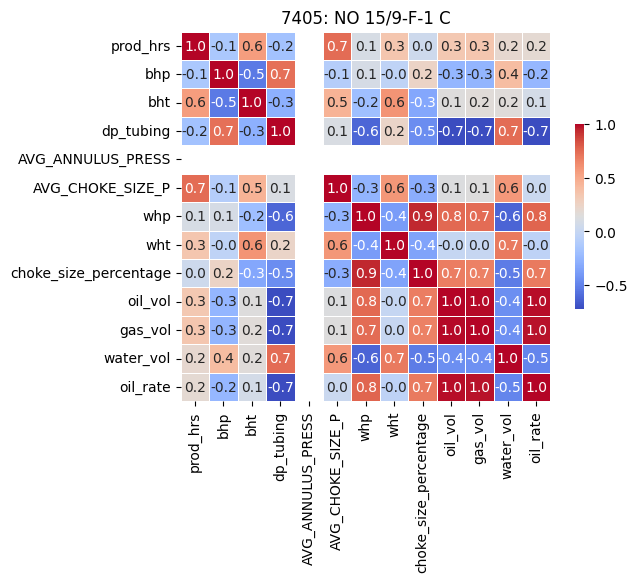

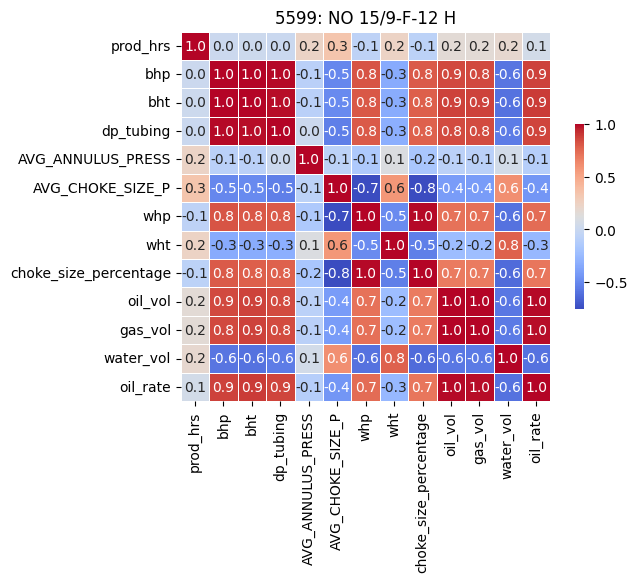

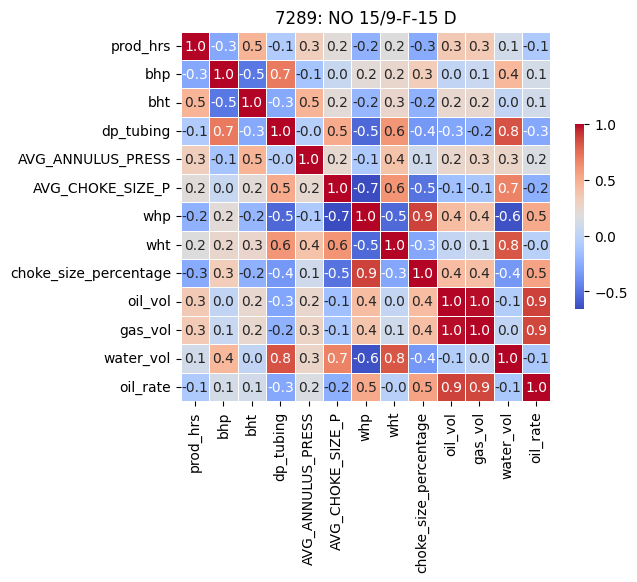

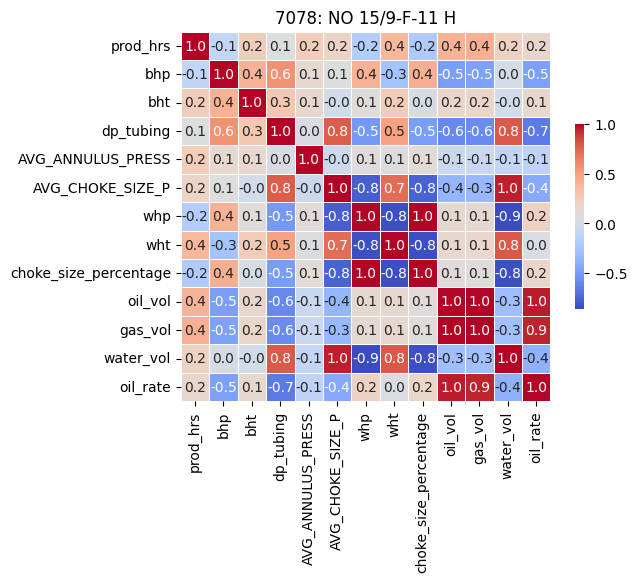

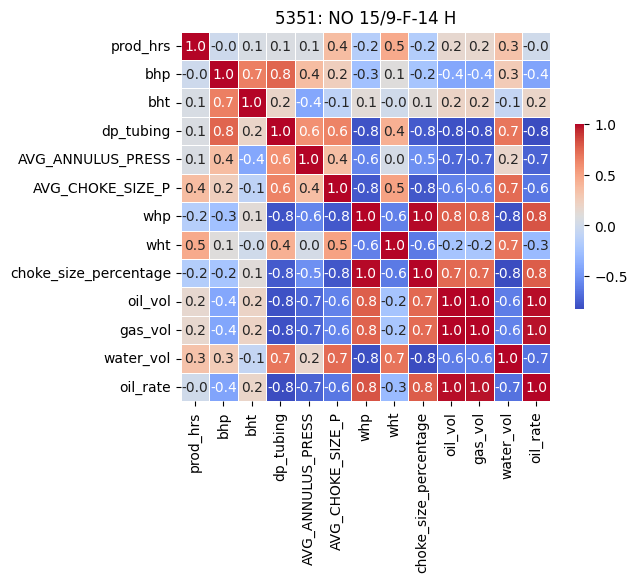

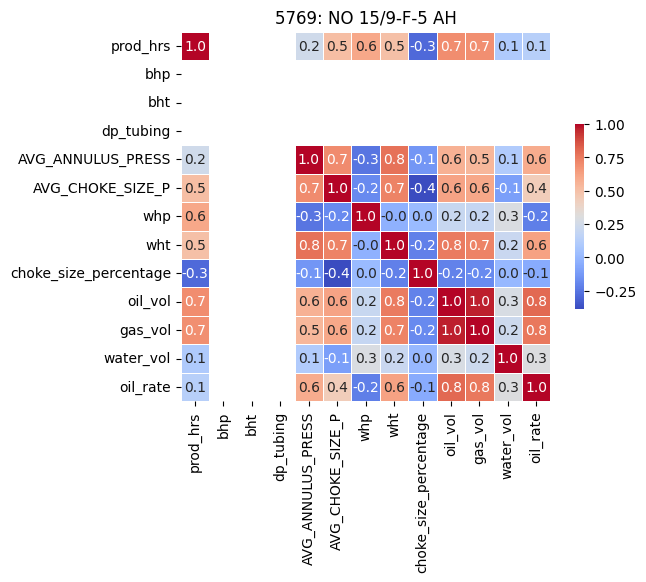

In [115]:
for i, j in well_info.items():
    correlation_matrix = df_active_producers[(df_active_producers.well_name==int(i))].select_dtypes(include=[np.number]).drop(["NPD_FIELD_CODE", "NPD_FACILITY_CODE", "well_name"], axis=1).corr() # creating correlation matrix per well
    sns.heatmap(correlation_matrix, annot=True, fmt=".1f", cmap='coolwarm', square=True, linewidths=.5, cbar_kws={"shrink": .5})
    plt.title(f'{i}: {j}')
    plt.show() # displaying correlation matrix per well

As you can see, some columns are completely null in specific wells such as BHP, BHT and DP Tubing for well 5769 or average annulus pressure for well 7405

In [116]:
if df_active_producers[(df_active_producers.well_name==int(5769))][['bhp', 'bht', 'dp_tubing']].isna().all().all(): # checking if bhp, bht and dp_tubing columns are all null in well 5769
     print("BHP, BHT and DP Tubing are all completely null in well 5679")

BHP, BHT and DP Tubing are all completely null in well 5679


In [117]:
print(f"The % of null values in column AVG_ANNULUS_PRESS for well 7405 is {(df_active_producers[df_active_producers.well_name==int(7405)].isnull().mean() * 100)['AVG_ANNULUS_PRESS'].round(2)}%") # checking if column AVG_ANNUAL_PRESS is almost completely null in well 7405

The % of null values in column AVG_ANNULUS_PRESS for well 7405 is 99.77%


plot 5599 bhp and bht

In [118]:
print(f"There % of 0 values in both columns bht and bhp is well 5599 is {len(df_active_producers[(df_active_producers.well_name==int(5599)) & (df_active_producers['bht'] == 0) & (df_active_producers['bhp'] == 0)]) / len(df_active_producers[df_active_producers.well_name==int(5599)]) * 100:.2f} %") # checking for % of 0 values in bht and bhp columns for well 5599

There % of 0 values in both columns bht and bhp is well 5599 is 67.26 %


I interpreted this as specific wells missing measurements due to either not being calculated or not having the suitable apparatus to measure these values. This creates an issue as this means not all features can be always used for specific wells. This opens up the discussion on whether to eliminate this feature completely or try to fill the column with predicted values.

In [119]:
for i, j in well_info.items():
    correlation_matrix = df_active_producers[(df_active_producers.well_name==int(i))].select_dtypes(include=[np.number]).drop(["NPD_FIELD_CODE", "NPD_FACILITY_CODE", "well_name"], axis=1).corr()
    print(f'FOR WELL {i}: {j}\n')
    for m in ['oil_rate', 'oil_vol', 'gas_vol', 'water_vol']:
        print("\tCorrelation values for", m)
        print(correlation_matrix[m].sort_values(ascending=False), "\n\n") # displaying the correlation values for oil, water and gas volume as well as oil rate PER WELL as these are the important dependent values

FOR WELL 7405: NO 15/9-F-1 C

	Correlation values for oil_rate
oil_rate                 1.000000
oil_vol                  0.985917
gas_vol                  0.975107
whp                      0.769033
choke_size_percentage    0.696344
prod_hrs                 0.190021
bht                      0.075717
AVG_CHOKE_SIZE_P         0.022793
wht                     -0.043136
bhp                     -0.243987
water_vol               -0.491026
dp_tubing               -0.721293
AVG_ANNULUS_PRESS             NaN
Name: oil_rate, dtype: float64 


	Correlation values for oil_vol
oil_vol                  1.000000
gas_vol                  0.991367
oil_rate                 0.985917
whp                      0.756521
choke_size_percentage    0.679678
prod_hrs                 0.329512
bht                      0.143949
AVG_CHOKE_SIZE_P         0.128495
wht                     -0.003340
bhp                     -0.253286
water_vol               -0.447734
dp_tubing               -0.720057
AVG_ANNULUS_PRESS    

The per well analysis also showed me how correlations differed well to well, which didn't show much variation except for well 5769, which is a relatively new well.

I also looked at any gaps in the data collection of the wells so I counted the amount of gaps in dates per wall. This showed that this will relatively not be a major issue because the gaps were substantially low of the data compared to data collected on consecutive days.

In [120]:
for i, j in well_info.items():
    gap_counter = 0
    consecutive_counter = 0
    dates = list(df_active_producers[(df_active_producers.well_name==i)]['date']) # getting list of dates per well
    print(f'FOR WELL {i}: {j}\n')
    print("The gap dates are:")
    for m in range(len(dates) - 1):
        if (dates[m+1] - dates[m]) > pd.Timedelta(days=1): # checking if two consecutive dates in the data collection are actually conecutive
            gap_counter += 1
            print((dates[m].strftime('%Y-%m-%d'), dates[m+1].strftime('%Y-%m-%d'))) # if not consecutive, print the date
        else:
            consecutive_counter += 1
    print(f"There are {gap_counter} gaps in dates\nThere are {consecutive_counter} consecutive dates\n\n")

FOR WELL 7405: NO 15/9-F-1 C

The gap dates are:
('2014-07-06', '2014-07-08')
('2014-08-18', '2014-09-03')
('2014-09-28', '2014-10-01')
('2014-11-23', '2014-11-30')
('2014-12-01', '2015-01-01')
('2015-01-21', '2015-02-09')
('2015-02-27', '2015-03-18')
('2015-04-01', '2015-04-20')
('2015-05-03', '2015-05-22')
('2015-05-27', '2015-06-11')
('2015-07-01', '2015-07-22')
('2015-08-07', '2015-09-04')
('2015-09-20', '2015-10-14')
('2015-10-30', '2015-11-18')
('2015-12-09', '2016-01-04')
('2016-01-20', '2016-02-06')
('2016-02-26', '2016-03-17')
There are 17 gaps in dates
There are 410 consecutive dates


FOR WELL 5599: NO 15/9-F-12 H

The gap dates are:
('2008-03-26', '2008-03-28')
('2008-04-27', '2008-04-29')
('2008-05-30', '2008-06-02')
('2008-08-06', '2008-08-08')
('2008-09-02', '2008-09-06')
('2008-09-08', '2008-09-10')
('2009-03-13', '2009-03-15')
('2009-03-16', '2009-03-18')
('2009-03-25', '2009-03-30')
('2009-05-04', '2009-05-06')
('2009-08-02', '2009-08-05')
('2009-08-29', '2009-09-05')

Conclusion: This section focused on seeing per well interdependencies to see how correlations differ well to well as well as examining data integrity per well.

## Imputing NA Columns for Specific Wells (Optional)

In [121]:
empty = df_active_producers[df_active_producers[['whp', 'wht']].isna().any(axis=1)]
empty_well = list(set(empty['well_name']))
print(empty_well)
empty

[7078]


,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,FLOW_KIND,well_type,oil_rate
430,2013-07-26,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,24.0,NaN,NaN,NaN,NaN,9.419192,%,NaN,NaN,48.636793,891.48,131386.55,0.0,production,OP,891.48
431,2013-07-27,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,24.0,NaN,NaN,NaN,NaN,9.322098,%,NaN,NaN,24.318397,886.42,134616.72,0.0,production,OP,886.42
433,2013-07-30,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,24.0,NaN,NaN,NaN,NaN,9.778705,%,NaN,NaN,33.201885,1032.38,155864.67,0.0,production,OP,1032.38


In [122]:
well = df_active_producers[(df_active_producers.well_name==int(7078))][['wht', 'whp']]
well = well.interpolate()
df_active_producers.loc[(df_active_producers.well_name==int(7078)), ['wht', 'whp']] = well

In [123]:
null_well = df_active_producers[(df_active_producers.well_name==int(5769))]
feature_columns = ['prod_hrs', 'AVG_CHOKE_SIZE_P', 'whp', 'wht', 'choke_size_percentage', 'oil_vol', 'gas_vol', 'water_vol', 'oil_rate'] # specifying feature columns for imputation
knn_columns = feature_columns + ['bhp', 'bht', 'dp_tubing'] # adding target features

df_active_producers_knn = df_active_producers[knn_columns].copy()
scaler = StandardScaler()
df_active_producers_knn_scaled = scaler.fit_transform(df_active_producers_knn) # standardizing data
knn_imputer = KNNImputer(n_neighbors=5) # creating imputer with KNN N = 5 neighbours
df_active_producers_knn_impute_scaled = knn_imputer.fit_transform(df_active_producers_knn_scaled) # fitting data
imputed = pd.DataFrame(scaler.inverse_transform(df_active_producers_knn_impute_scaled), columns=knn_columns)
df_active_producers[['bhp', 'bht', 'dp_tubing']] = imputed[['bhp', 'bht', 'dp_tubing']]

print("\nDataFrame after KNN Regression Imputation:")
df_active_producers


DataFrame after KNN Regression Imputation:


,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,FLOW_KIND,well_type,oil_rate
0,2014-04-22,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,289.421362,106.353209,182.059312,0.000000,43.343451,%,107.362050,37.939251,78.935409,631.47,90439.09,0.00,production,OP,631.470000
1,2014-04-23,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,270.239793,107.643779,171.052782,NaN,47.167523,%,99.187011,60.756579,70.627109,1166.46,165720.39,0.00,production,OP,1166.460000
2,2014-04-24,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,262.842747,107.869234,168.241977,NaN,47.732310,%,94.600770,63.046800,66.049151,1549.81,221707.31,0.00,production,OP,1549.810000
3,2014-04-25,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,255.526995,107.971137,165.538903,NaN,48.533769,%,89.988092,64.547229,61.405386,1248.70,178063.52,0.00,production,OP,1248.700000
4,2014-04-26,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,247.199052,108.052030,162.422242,NaN,49.844502,%,84.776810,65.723694,56.147906,1345.78,192602.19,0.00,production,OP,1345.780000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,2016-08-22,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,89.757857,43.088573,96.854417,24.998372,100.000000,%,23.650190,57.479738,0.119955,371.33,57934.84,90.61,production,OP,371.330000
7983,2016-08-23,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,89.757857,43.088573,96.854417,25.073654,100.000000,%,23.728094,56.861513,0.190029,378.55,59119.57,90.11,production,OP,378.550000
7984,2016-08-24,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,89.757857,43.088573,96.854417,24.933768,100.000000,%,23.703260,56.248741,0.167719,376.86,58632.31,91.32,production,OP,376.860000
7985,2016-08-25,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,42.300437,21.614582,60.725325,24.930640,100.000000,%,23.641755,57.883541,0.102264,377.44,59337.43,91.38,production,OP,377.440000


In [124]:
null_well = df_active_producers[(df_active_producers.well_name==int(7405))]
feature_columns = ['prod_hrs', 'AVG_CHOKE_SIZE_P', 'whp', 'wht', 'choke_size_percentage', 'oil_vol', 'gas_vol', 'water_vol', 'oil_rate'] # specifying feature columns for imputation

knn_columns = feature_columns + ['AVG_ANNULUS_PRESS'] # adding target feature
df_active_producers_knn = df_active_producers[knn_columns].copy()
scaler = StandardScaler() 
df_active_producers_knn_scaled = scaler.fit_transform(df_active_producers_knn) # standardizing data
knn_imputer = KNNImputer(n_neighbors=5) # creating imputer with KNN N = 5 neighbours
df_active_producers_knn_impute_scaled = knn_imputer.fit_transform(df_active_producers_knn_scaled) # fitting data
imputed = pd.DataFrame(scaler.inverse_transform(df_active_producers_knn_impute_scaled), columns=knn_columns)
df_active_producers['AVG_ANNULUS_PRESS'] = imputed['AVG_ANNULUS_PRESS']

print("\nDataFrame after KNN Regression Imputation:")
df_active_producers


DataFrame after KNN Regression Imputation:


,date,WELL_BORE_CODE,well_name,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,FLOW_KIND,well_type,oil_rate
0,2014-04-22,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,289.421362,106.353209,182.059312,0.000000,43.343451,%,107.362050,37.939251,78.935409,631.47,90439.09,0.00,production,OP,631.470000
1,2014-04-23,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,270.239793,107.643779,171.052782,16.617765,47.167523,%,99.187011,60.756579,70.627109,1166.46,165720.39,0.00,production,OP,1166.460000
2,2014-04-24,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,262.842747,107.869234,168.241977,10.484863,47.732310,%,94.600770,63.046800,66.049151,1549.81,221707.31,0.00,production,OP,1549.810000
3,2014-04-25,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,255.526995,107.971137,165.538903,24.966918,48.533769,%,89.988092,64.547229,61.405386,1248.70,178063.52,0.00,production,OP,1248.700000
4,2014-04-26,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,247.199052,108.052030,162.422242,24.966918,49.844502,%,84.776810,65.723694,56.147906,1345.78,192602.19,0.00,production,OP,1345.780000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,2016-08-22,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,89.757857,43.088573,96.854417,24.998372,100.000000,%,23.650190,57.479738,0.119955,371.33,57934.84,90.61,production,OP,371.330000
7983,2016-08-23,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,89.757857,43.088573,96.854417,25.073654,100.000000,%,23.728094,56.861513,0.190029,378.55,59119.57,90.11,production,OP,378.550000
7984,2016-08-24,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,89.757857,43.088573,96.854417,24.933768,100.000000,%,23.703260,56.248741,0.167719,376.86,58632.31,91.32,production,OP,376.860000
7985,2016-08-25,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,42.300437,21.614582,60.725325,24.930640,100.000000,%,23.641755,57.883541,0.102264,377.44,59337.43,91.38,production,OP,377.440000


In [125]:
df_active_producers.isna().any()

date                     False
WELL_BORE_CODE           False
well_name                False
NPD_WELL_BORE_NAME       False
NPD_FIELD_CODE           False
NPD_FIELD_NAME           False
NPD_FACILITY_CODE        False
NPD_FACILITY_NAME        False
prod_hrs                 False
bhp                      False
bht                      False
dp_tubing                False
AVG_ANNULUS_PRESS        False
AVG_CHOKE_SIZE_P         False
AVG_CHOKE_UOM            False
whp                      False
wht                      False
choke_size_percentage    False
oil_vol                  False
gas_vol                  False
water_vol                False
FLOW_KIND                False
well_type                False
oil_rate                 False
dtype: bool

## Visualization After Cleaning

Objective: This section is simply intended to visualize the graphs after cleaning so the difference can be compared and check that the data has been cleaned or abnormal behavior.

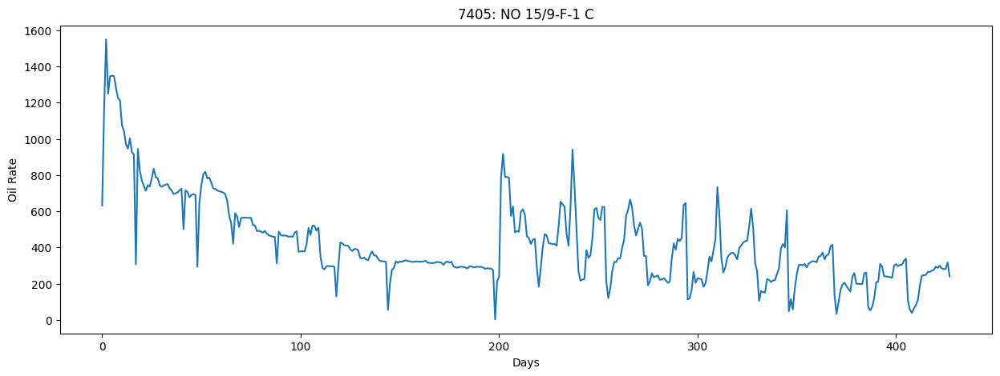

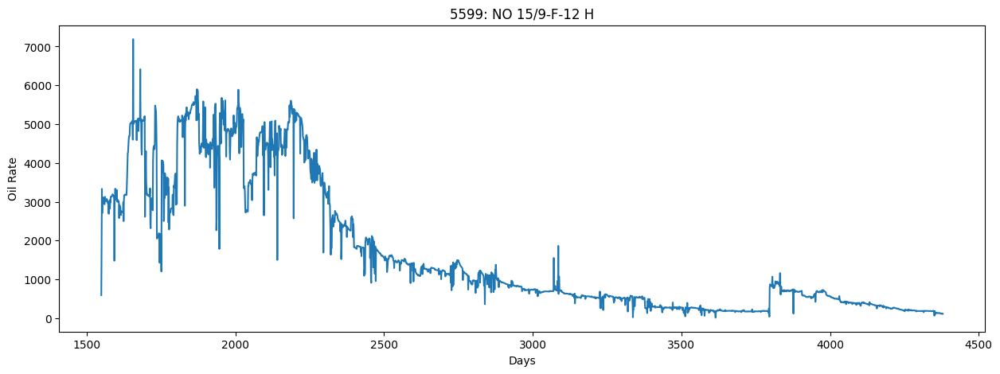

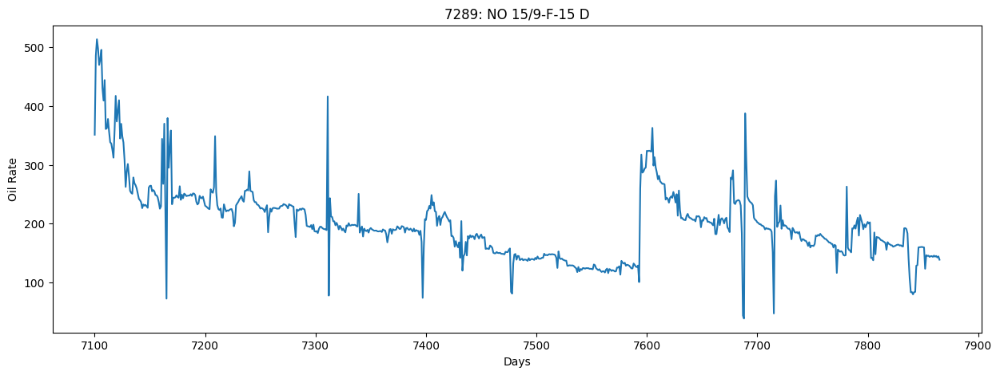

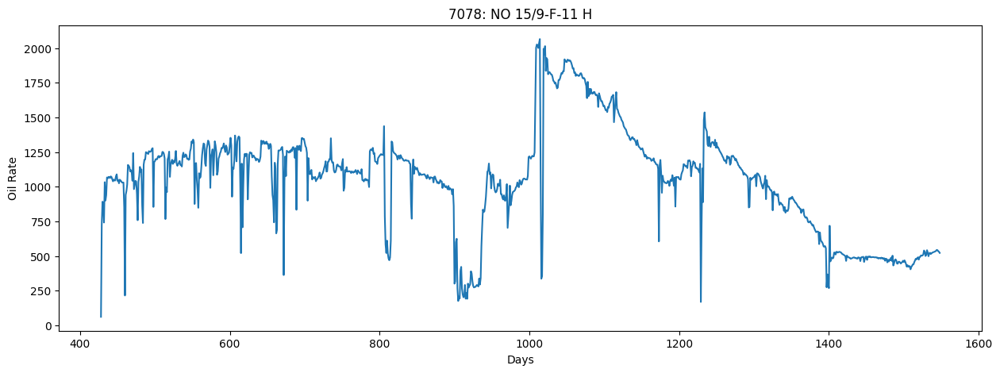

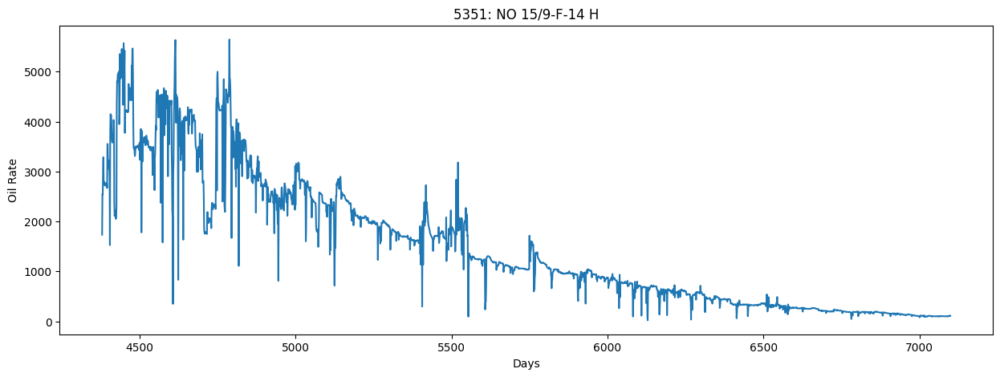

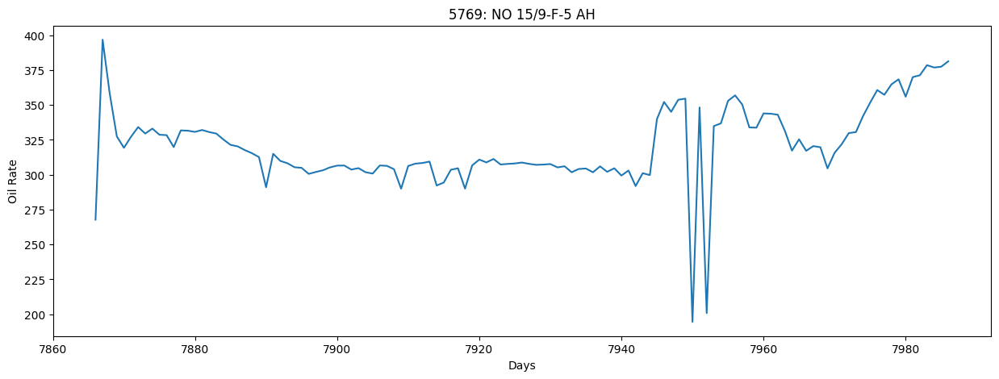

In [126]:
for i, j in well_info.items():
    plt.figure(figsize=(15,5))
    plt.title(f'{i}: {j}')
    plt.plot(df_active_producers[(df_active_producers.well_name==i)]['oil_rate']) # visualizing the oil rate over time per well
    plt.xlabel("Days")
    plt.ylabel("Oil Rate")
    plt.show()

Another valuable plot that would show relationships of features would be plotting oil rate with all other features to show how they progress over time and how close the similarity is.

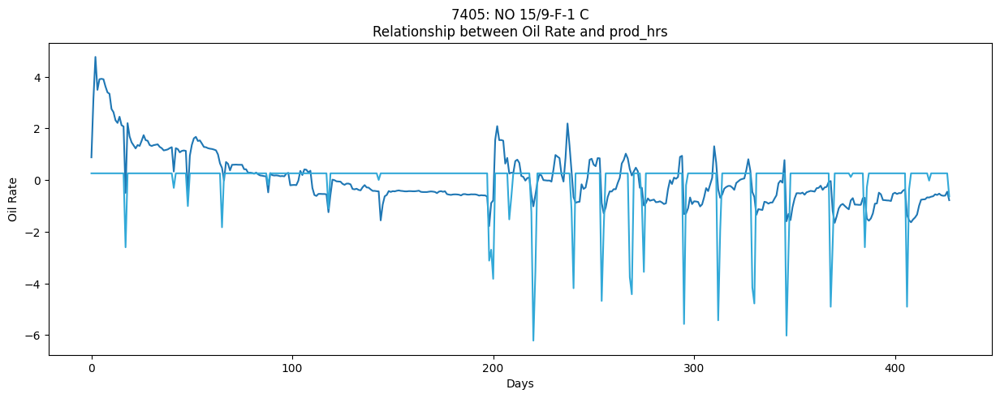

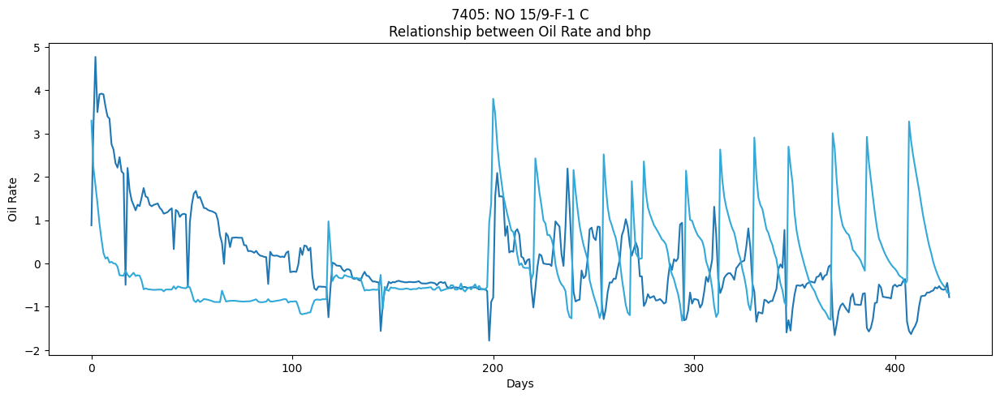

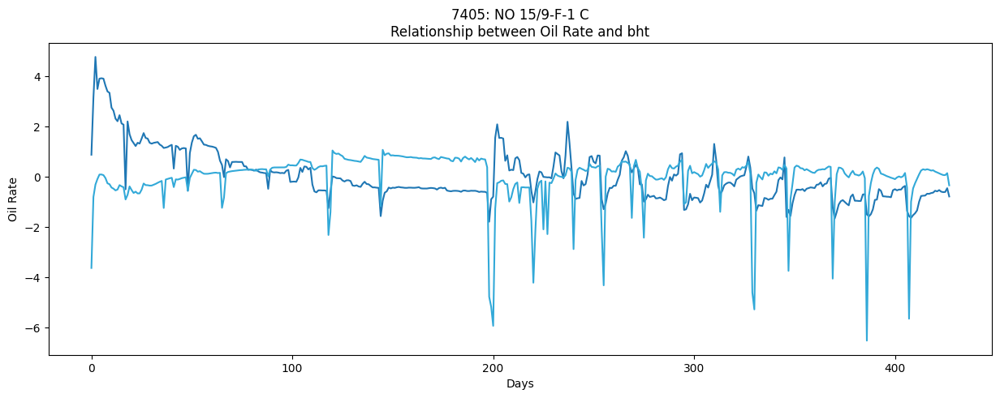

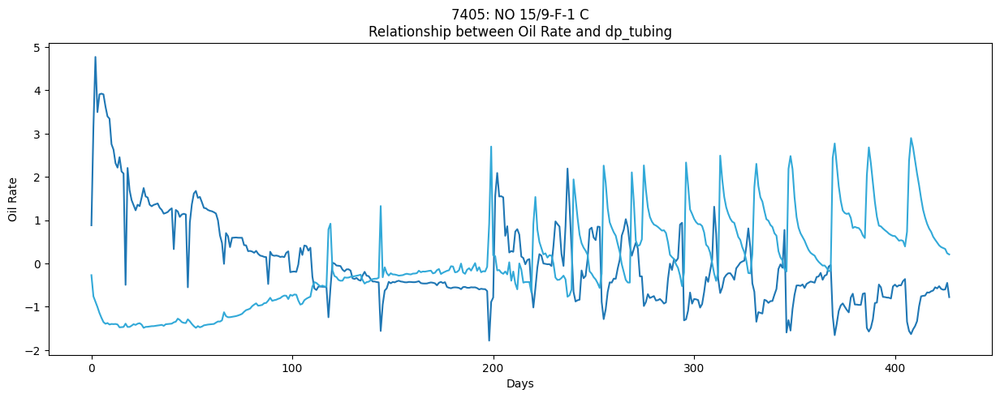

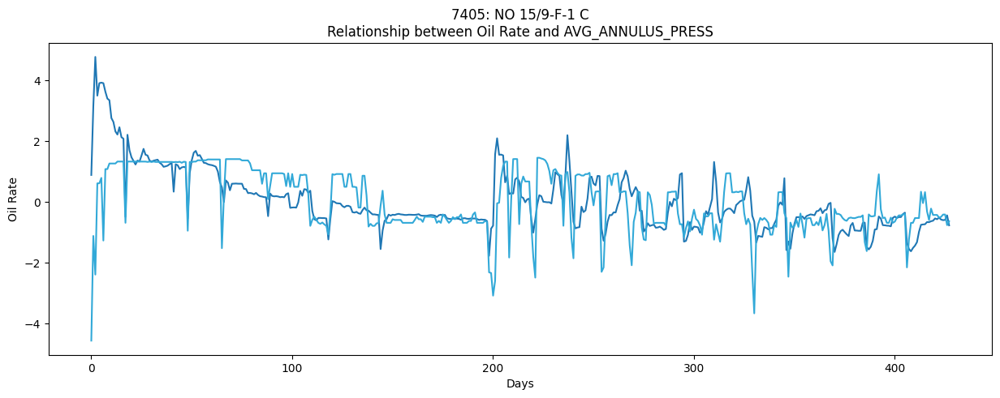

...

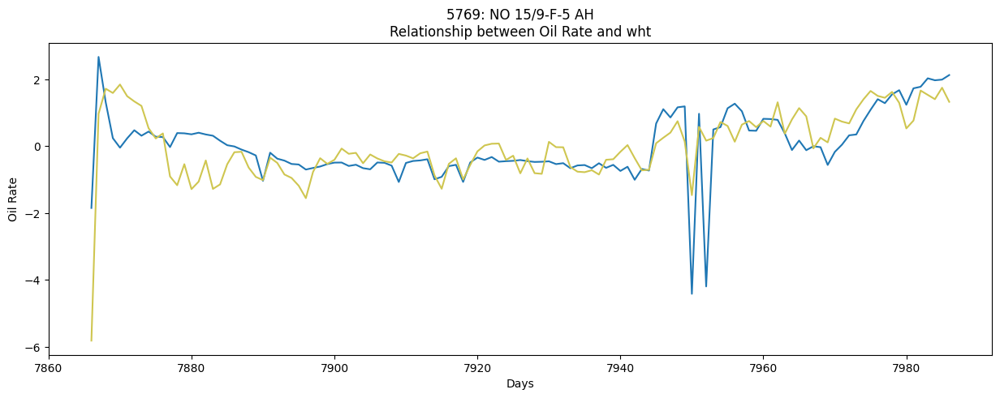

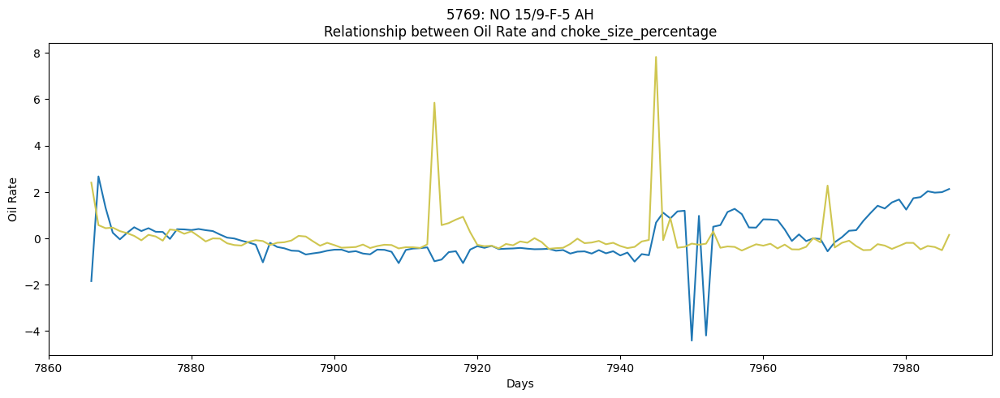

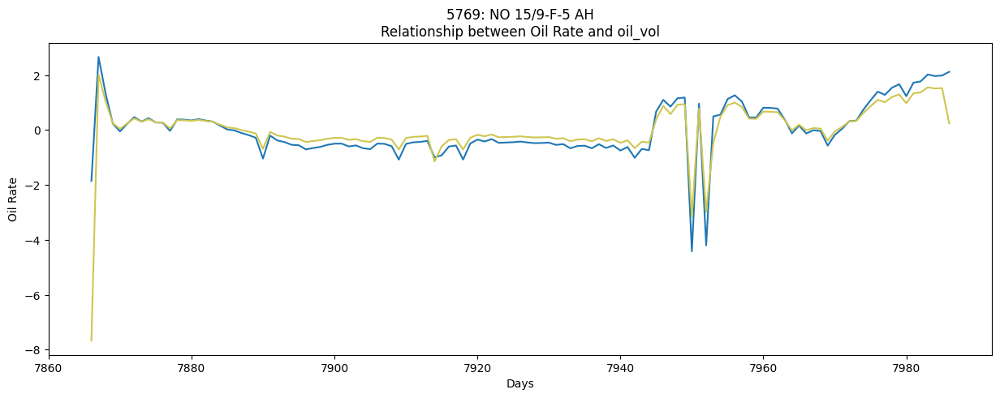

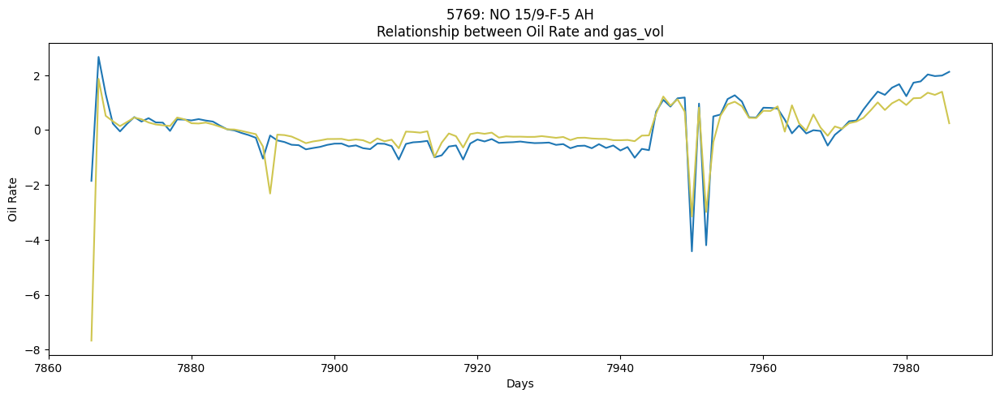

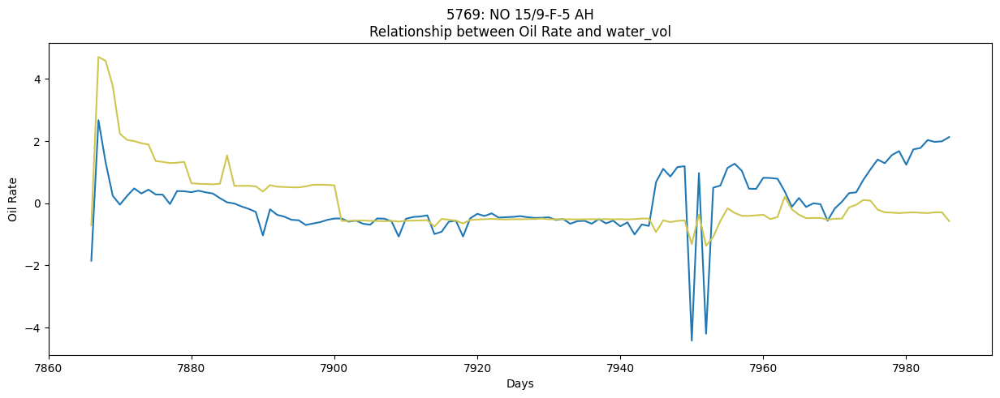

In [127]:
numeric_columns = df_active_producers.select_dtypes(include=[np.number]).drop(["NPD_FIELD_CODE", "NPD_FACILITY_CODE"], axis=1).columns
for i, j in well_info.items():
    color = np.random.rand(3,)
    for m in numeric_columns:
        if m not in ['oil_rate', 'well_name']:
            well = df_active_producers[(df_active_producers.well_name==int(i))]
            plt.figure(figsize=(15,5))
            plt.title(f'{i}: {j}\nRelationship between Oil Rate and {m}')
            oil_rate_z = (well['oil_rate'] - well['oil_rate'].mean()) / well['oil_rate'].std()
            other_z = (well[m] - well[m].mean()) / well[m].std()
            plt.plot(oil_rate_z) # visualizing the oil rate over time per well
            plt.plot(other_z, color=color) # visualizing the other column over time per well
            plt.xlabel("Days")
            plt.ylabel("Oil Rate")
            plt.show()
    

In [128]:
df_active_producers.select_dtypes(include=[np.number]).drop(["NPD_FIELD_CODE", "NPD_FACILITY_CODE"], axis=1)

,well_name,prod_hrs,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,whp,wht,choke_size_percentage,oil_vol,gas_vol,water_vol,oil_rate
0,7405,24.00000,289.421362,106.353209,182.059312,0.000000,43.343451,107.362050,37.939251,78.935409,631.47,90439.09,0.00,631.470000
1,7405,24.00000,270.239793,107.643779,171.052782,16.617765,47.167523,99.187011,60.756579,70.627109,1166.46,165720.39,0.00,1166.460000
2,7405,24.00000,262.842747,107.869234,168.241977,10.484863,47.732310,94.600770,63.046800,66.049151,1549.81,221707.31,0.00,1549.810000
3,7405,24.00000,255.526995,107.971137,165.538903,24.966918,48.533769,89.988092,64.547229,61.405386,1248.70,178063.52,0.00,1248.700000
4,7405,24.00000,247.199052,108.052030,162.422242,24.966918,49.844502,84.776810,65.723694,56.147906,1345.78,192602.19,0.00,1345.780000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,5769,24.00000,89.757857,43.088573,96.854417,24.998372,100.000000,23.650190,57.479738,0.119955,371.33,57934.84,90.61,371.330000
7983,5769,24.00000,89.757857,43.088573,96.854417,25.073654,100.000000,23.728094,56.861513,0.190029,378.55,59119.57,90.11,378.550000
7984,5769,24.00000,89.757857,43.088573,96.854417,24.933768,100.000000,23.703260,56.248741,0.167719,376.86,58632.31,91.32,376.860000
7985,5769,24.00000,42.300437,21.614582,60.725325,24.930640,100.000000,23.641755,57.883541,0.102264,377.44,59337.43,91.38,377.440000


Conclusion: This section shows that the data has stabilized substantially and it is now ready for analysis. It was also used to visualize trends in features compared to the target variable to understand the data better.

## Time Series Statistics

Objective: This section is intended to focus on analyzing the time series characteristics of the data, relating to its staionarity.

After cleaning up the data, I began performing some tests on the data to observe general trends in it. I began with performing an ADF and KPSS test for station time series and all results for all came back to produce non-stationary trends in the data so it is safe to say the data is non-stationary which follows the background information on oil extraction.

In [129]:
import warnings
for i, j in well_info.items():
    print(f'FOR WELL {i}: {j}\n')
    timeseries_data = df_active_producers[(df_active_producers.well_name==i)]['oil_rate']
    adf_result = adfuller(timeseries_data, autolag='AIC') # performing AIC test
    print('ADF Statistic:', adf_result[0])
    print('p-value:', adf_result[1])
    print('Critical Values:', adf_result[4])
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=InterpolationWarning)
        kpss_result = kpss(timeseries_data, regression='c') # performing KPSS test
    print('KPSS Statistic:', kpss_result[0])
    print('p-value:', kpss_result[1])
    print('Critical Values:', kpss_result[3])
    print("\n\n")

FOR WELL 7405: NO 15/9-F-1 C

ADF Statistic: -4.479374806435162
p-value: 0.00021422059149097013
Critical Values: {'1%': -3.4459042013025836, '5%': -2.8683970525583358, '10%': -2.5704225783970176}
KPSS Statistic: 1.9616097097794842
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}



FOR WELL 5599: NO 15/9-F-12 H

ADF Statistic: -1.2848689817215817
p-value: 0.636066030329064
Critical Values: {'1%': -3.432680112445367, '5%': -2.8625694810866644, '10%': -2.567318024207903}
KPSS Statistic: 7.005659383632515
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}



FOR WELL 7289: NO 15/9-F-15 D

ADF Statistic: -5.035019300149259
p-value: 1.8911059663077348e-05
Critical Values: {'1%': -3.4389835846902788, '5%': -2.8653504478604757, '10%': -2.5687990737534627}
KPSS Statistic: 1.5752427406655296
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}



FOR WELL 7078: NO 15/9-F-11 H

ADF Statist

Conclusion: These results show that, as expected for oil/gas/water data, the data is non-stationary for all wells on both the ADF and KPSS tests.

## Finding General Trends

Objective: This section is intended to analyze general trends that can be seen over time.

I began with creating a linear regression model, so it can produce a general trend straight line on the data to have a numerical and visual identifier on how the data changes overtime and in most cases, the data saw a general decline in oil production except for the short term well that seem like they are early in their life cycle.

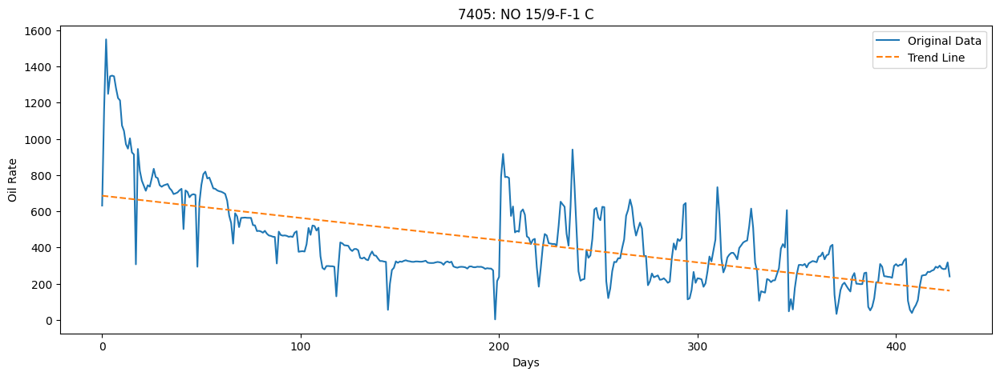

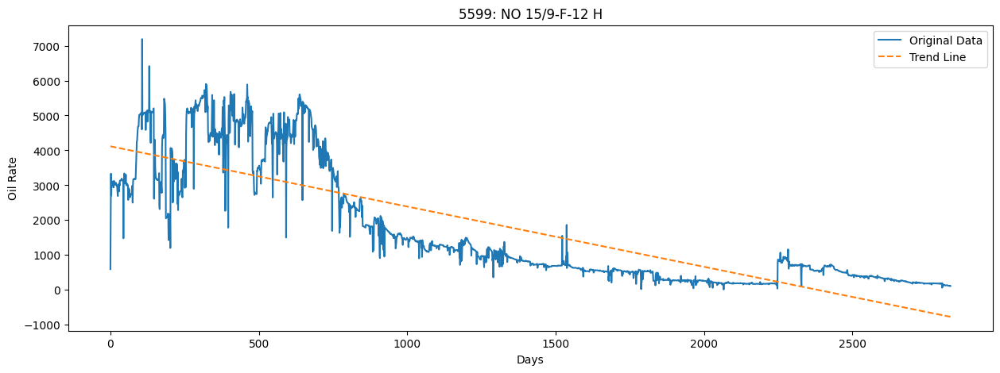

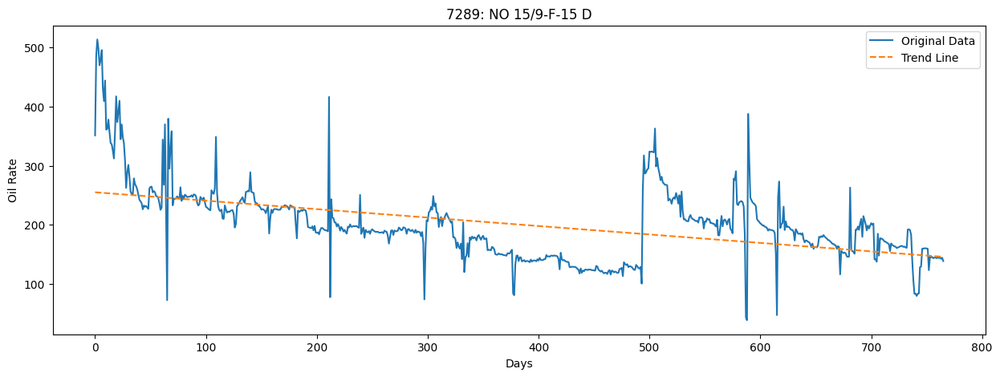

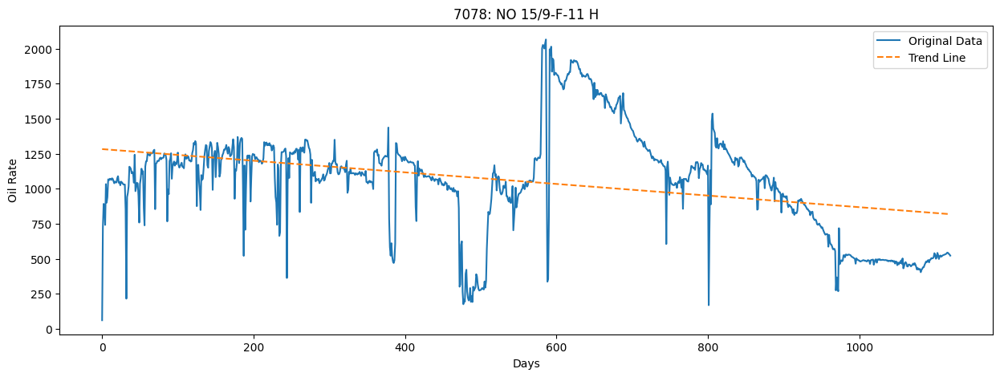

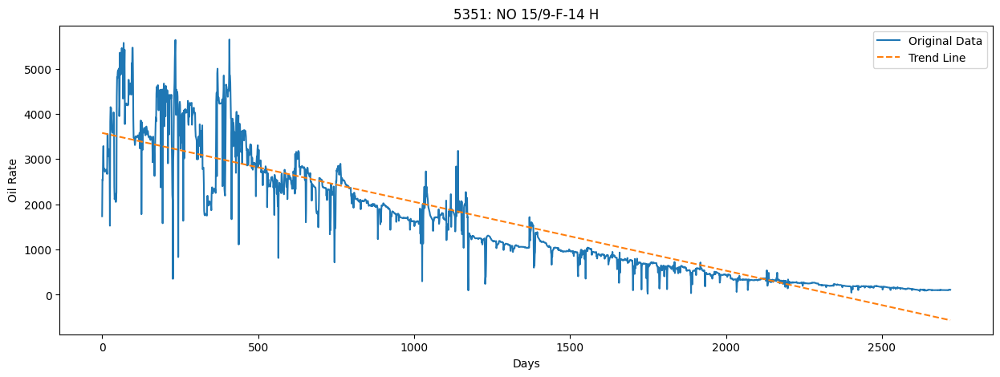

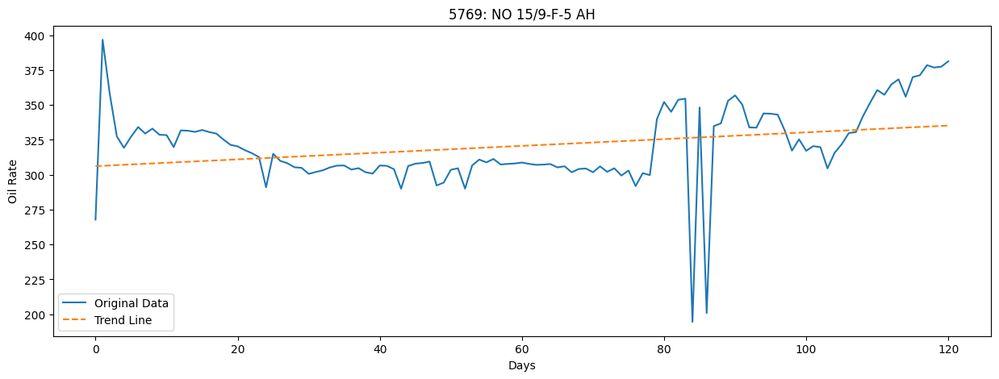

In [130]:
for i, j in well_info.items():
    linear_regression_model = LinearRegression() # creating a linear regression model per well
    well = df_active_producers[(df_active_producers.well_name==i)].reset_index()['oil_rate']
    well_index = np.arange(len(well)).reshape(-1, 1)
    linear_regression_model.fit(well_index, well) # fitting the model on the data
    trend_line = linear_regression_model.predict(well_index) # creating the general trend line
    plt.figure(figsize=(15,5))
    plt.title(f'{i}: {j}')
    plt.plot(well, label='Original Data')
    plt.plot(well.index, trend_line, label='Trend Line', linestyle='--')
    plt.legend()
    plt.xlabel('Days')
    plt.ylabel('Oil Rate')
    plt.show() # visualizing process

I also produced a rolling average window to produce a more smoother line overtime, and although this doesn’t tell you much about the data, it seems like a useful feature that could be used in the future during training and testing of the models.

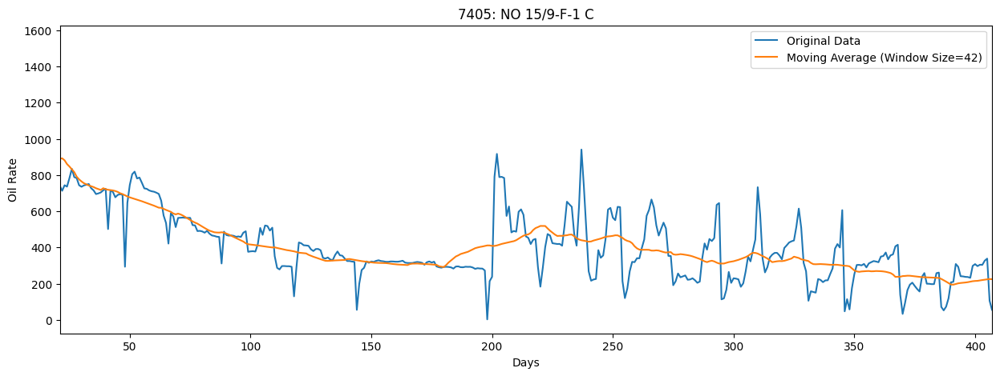

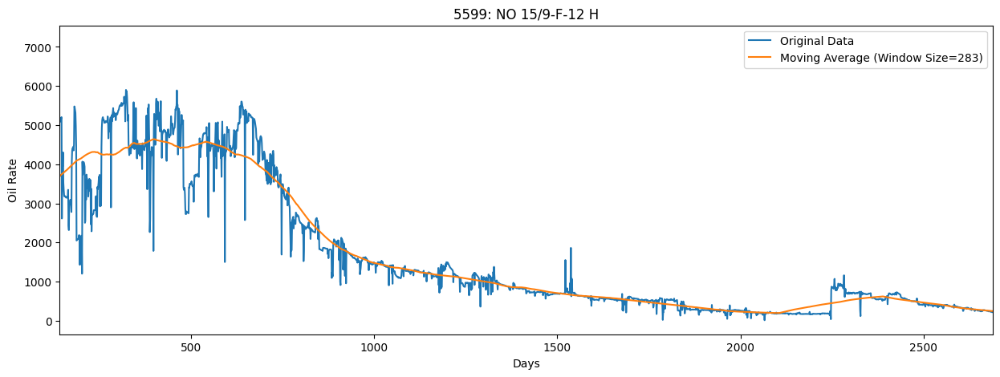

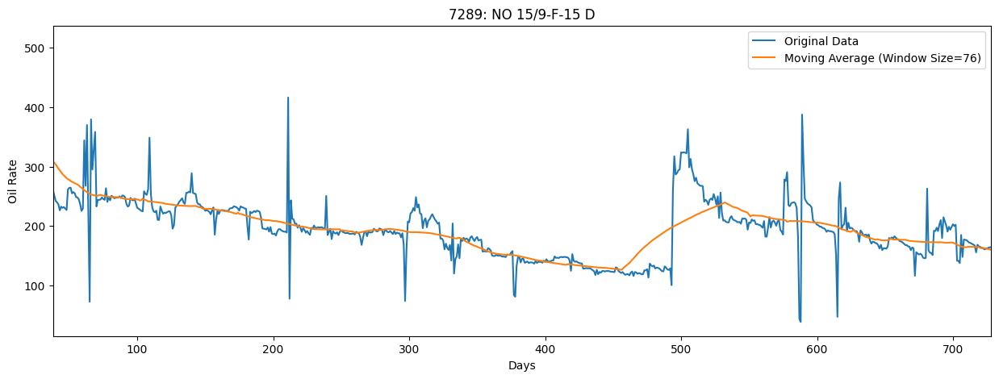

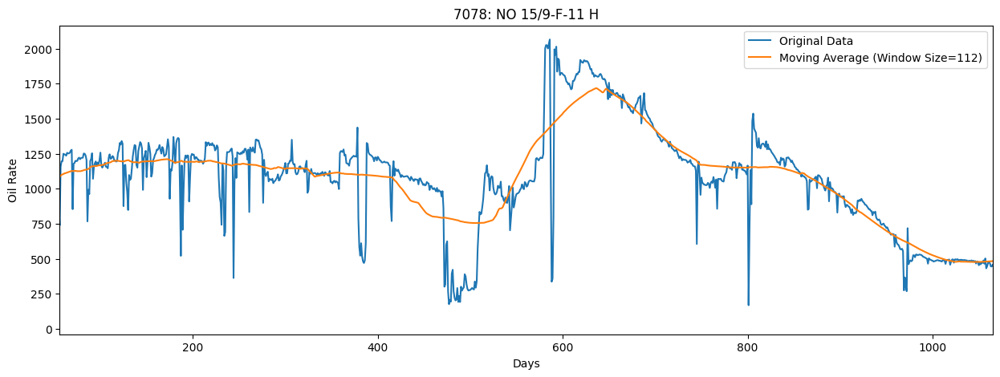

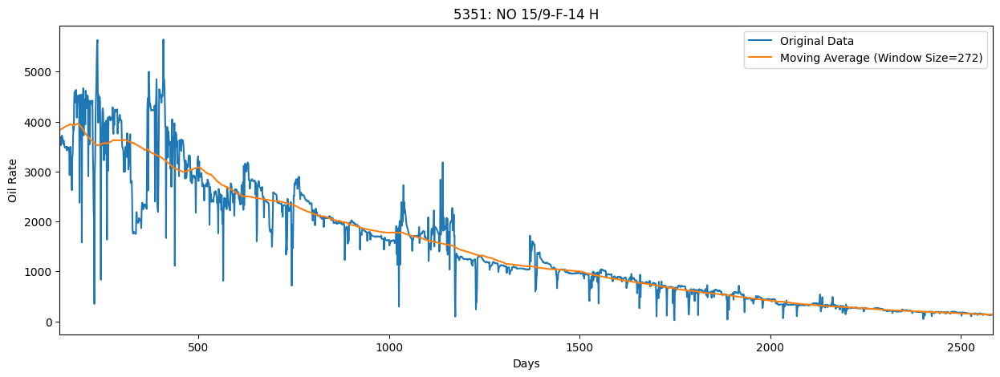

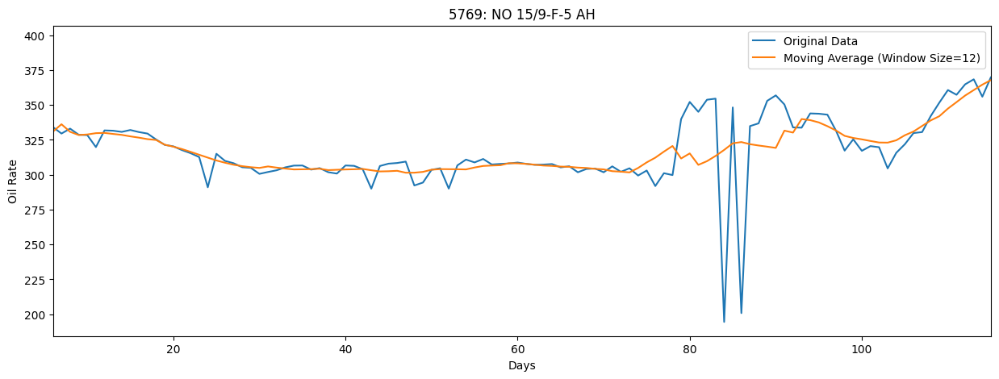

In [131]:
window_pct = 0.1
for i, j in well_info.items():
    well = df_active_producers[(df_active_producers.well_name==i)].reset_index()['oil_rate']
    window_size = int(len(well) * window_pct)
    rolling_avg = well.rolling(window=window_size, center=True).mean() # creating a rolling window average per well with 10% of each well's data as the window size
    plt.figure(figsize=(15,5))
    plt.title(f'{i}: {j}')
    plt.plot(well, label='Original Data')
    plt.plot(rolling_avg, label=f'Moving Average (Window Size={window_size})')
    plt.legend()
    plt.xlabel('Days')
    plt.ylabel('Oil Rate')
    start_date = well.index[window_size // 2]
    end_date = well.index[-window_size // 2]
    plt.xlim(start_date, end_date)
    plt.show() # visualizing general trend

Conclusion: The general trend tests showed an overall gradual decline across all wells as expected. These general trends may also be used as extra features for the models as a smoother history for the model can provide the models with a low computationally intensive yet valuable feature.

## Monthly Grouping Statistics

Objective: This section is intended to aggregate the data monthly which can be useful for in many different reasons in terms of visualization, adding extra features to the data and providing a better input on the data and creating a smoother more general trend over the data.

In [132]:
for i, j in well_info.items():
    print(f'FOR WELL {i}: {j}\n')
    well = df_active_producers[(df_active_producers.well_name==i)].reset_index()[['date', 'oil_rate']] # retriving oil rate per well
    monthly_avg = well.groupby(well['date'].dt.to_period('M')).mean() # finding monthly average oil rate per well
    monthly_avg.index = monthly_avg.index.strftime('%B %Y')
    print(monthly_avg['oil_rate'], "\n")

FOR WELL 7405: NO 15/9-F-1 C

date
April 2014        1238.052222
May 2014           807.480232
June 2014          662.763913
July 2014          486.140827
August 2014        387.246111
September 2014     354.104834
October 2014       304.991432
November 2014      279.649583
December 2014      213.848889
January 2015       545.482061
February 2015      518.691029
March 2015         432.553808
April 2015         343.212762
May 2015           502.823360
June 2015          322.624382
July 2015          199.971904
August 2015        451.024243
September 2015     397.171899
October 2015       254.710692
November 2015      260.243418
December 2015      362.934403
January 2016       185.453225
February 2016      228.753710
March 2016         195.579625
April 2016         283.900333
Name: oil_rate, dtype: float64 

FOR WELL 5599: NO 15/9-F-12 H

date
February 2008     2833.344928
March 2008        3009.010250
April 2008        2893.993682
May 2008          4206.944319
June 2008         5154.240

/var/folders/d8/xf5yjrpn5zvd1j56c42jys2w0000gn/T/ipykernel_25559/1802289335.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/var/folders/d8/xf5yjrpn5zvd1j56c42jys2w0000gn/T/ipykernel_25559/1802289335.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/var/folders/d8/xf5yjrpn5zvd1j56c42jys2w0000gn/T/ipykernel_25559/1802289335.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/var/folders/d8/xf5yjrpn5zvd1j56c42jy

/var/folders/d8/xf5yjrpn5zvd1j56c42jys2w0000gn/T/ipykernel_25559/3130335281.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



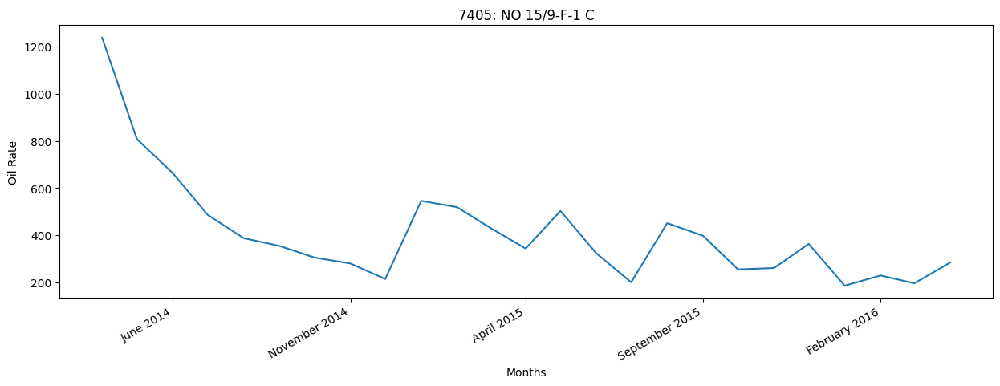

/var/folders/d8/xf5yjrpn5zvd1j56c42jys2w0000gn/T/ipykernel_25559/3130335281.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



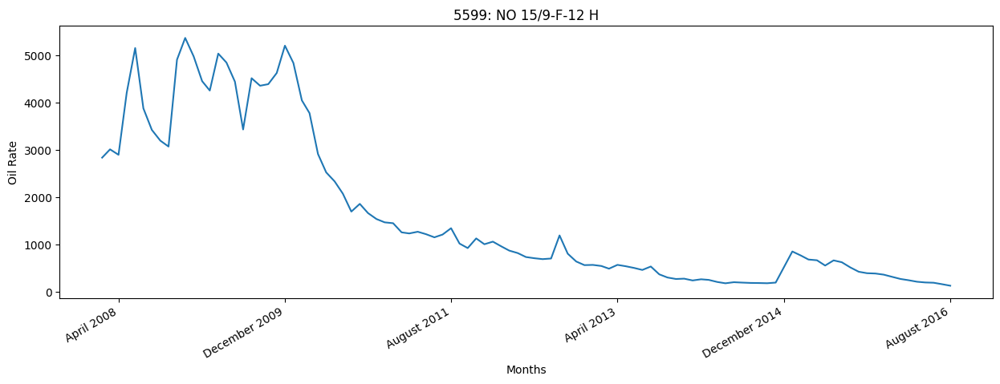

/var/folders/d8/xf5yjrpn5zvd1j56c42jys2w0000gn/T/ipykernel_25559/3130335281.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



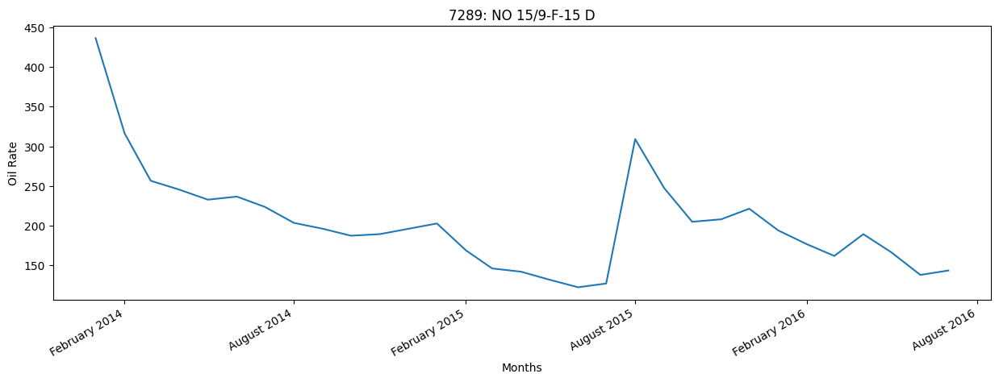

/var/folders/d8/xf5yjrpn5zvd1j56c42jys2w0000gn/T/ipykernel_25559/3130335281.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



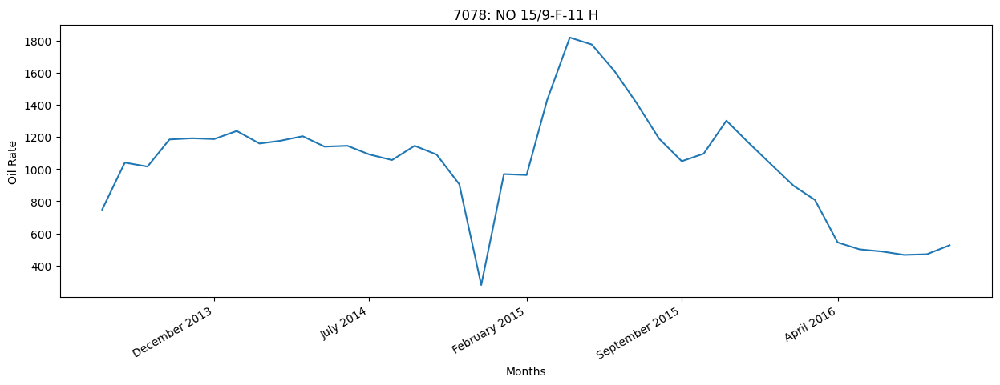

/var/folders/d8/xf5yjrpn5zvd1j56c42jys2w0000gn/T/ipykernel_25559/3130335281.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



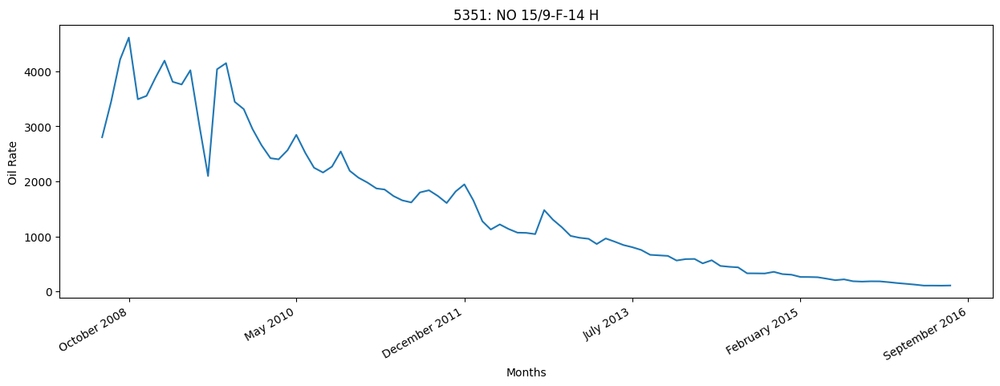

/var/folders/d8/xf5yjrpn5zvd1j56c42jys2w0000gn/T/ipykernel_25559/3130335281.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



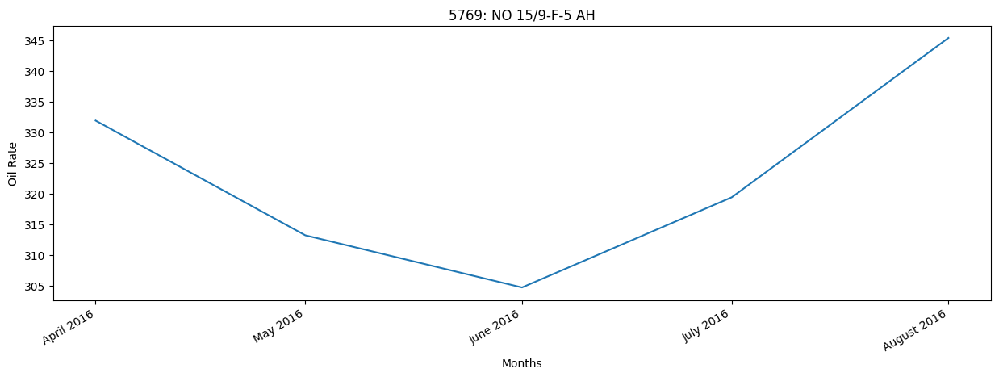

In [133]:
for i, j in well_info.items():
    well = df_active_producers[df_active_producers['well_name'] == i].reset_index()[['date', 'oil_rate']] # retriving oil rate per well
    well['date'] = pd.to_datetime(well['date'])
    monthly_avg = well.groupby(well['date'].dt.to_period('M')).mean() # grouping data monthly
    monthly_avg.index = monthly_avg.index.to_timestamp()
    plt.figure(figsize=(15, 5))
    plt.title(f'{i}: {j}')
    plt.plot(monthly_avg.index, monthly_avg['oil_rate']) # plotting monthly data
    ax = plt.gca()
    ax.xaxis.set_major_locator(MonthLocator(interval=int(len(monthly_avg['oil_rate']) * 0.2))) # optimizing x axis ticks for better visualization
    ax.xaxis.set_major_formatter(DateFormatter('%B %Y'))
    plt.gcf().autofmt_xdate()
    plt.xlabel('Months')
    plt.ylabel('Oil Rate')
    plt.show()

In [134]:
mean_columns = ['bhp', 'bht', 'dp_tubing', 'AVG_ANNULUS_PRESS', 'AVG_CHOKE_SIZE_P', 'whp', 'wht', 'choke_size_percentage', 'oil_rate'] # columns that will be averaged in the monthly dataset
cumulative_columns = ['prod_hrs', 'oil_vol', 'gas_vol', 'water_vol'] # columns that will be summed in the monthly dataset

all_wells_data = []
for well_code, well_name in well_info.items():
    well_data = df_active_producers[df_active_producers.well_name == well_code].reset_index(drop=True)
    well_data['date'] = pd.to_datetime(well_data['date'])
    well_data['month'] = well_data['date'].dt.to_period('M') # creating a month column to be used in naming in index
    monthly_avg = well_data.groupby('month')[mean_columns].mean() # averaging over month for columns to be averaged
    monthly_avg.index = monthly_avg.index.strftime('%B %Y') 
    monthly_cumsum = well_data.groupby('month')[cumulative_columns].sum().cumsum() # summing columns that should be summed
    monthly_cumsum.index = monthly_cumsum.index.strftime('%B %Y')
    combined_data = pd.concat([monthly_avg, monthly_cumsum], axis=1) # concating values into dataset
    combined_data['well_name'] = well_code
    all_wells_data.append(combined_data) # appending data to global monthly dataset

monthly_dataset = pd.concat(all_wells_data)
monthly_dataset.reset_index(inplace=True)
cols = ['month', 'well_name'] + [col for col in monthly_dataset.columns if col not in ['month', 'well_name']]
monthly_dataset = monthly_dataset[cols]
monthly_dataset

,month,well_name,bhp,bht,dp_tubing,AVG_ANNULUS_PRESS,AVG_CHOKE_SIZE_P,whp,wht,choke_size_percentage,oil_rate,prod_hrs,oil_vol,gas_vol,water_vol
0,April 2014,7405,251.892087,107.762875,164.541304,19.246384,48.521681,87.350784,61.699800,58.784512,1238.052222,216.000000,11142.47,1.597937e+06,0.000
1,May 2014,7405,223.970505,107.815733,155.976085,28.051832,46.416057,67.994420,55.577824,39.485179,807.480232,949.833340,36044.42,5.094166e+06,783.480
2,June 2014,7405,217.458386,108.004911,157.561726,27.540263,46.621148,59.896660,56.331713,31.588820,662.763913,1655.750000,55662.18,7.980828e+06,2851.960
3,July 2014,7405,215.313723,108.151182,166.593740,26.940282,47.284669,48.719983,56.802281,20.253619,486.140827,2374.166660,70225.86,1.015235e+07,8941.470
4,August 2014,7405,213.568353,108.234378,172.936208,22.060162,49.149639,40.632145,56.606001,12.081788,387.246111,2806.166660,77196.29,1.120054e+07,13471.220
5,September 2014,7405,224.636158,108.261308,182.572149,23.023952,49.317579,42.064009,58.678876,13.579967,354.104834,3424.425000,86364.72,1.261464e+07,21788.810
6,October 2014,7405,220.303858,108.346780,184.270711,19.351949,51.013658,36.033147,55.173449,8.224089,304.991432,4168.425000,95832.78,1.407670e+07,32153.680
7,November 2014,7405,221.713439,108.224225,185.935122,18.857567,50.583121,35.778316,55.882309,8.212946,279.649583,4732.425000,102543.11,1.512089e+07,39387.920
8,December 2014,7405,255.410310,105.647680,248.865610,10.734956,56.644214,6.544700,20.873010,2.258170,213.848889,4745.925000,102663.40,1.514675e+07,39571.360
9,January 2015,7405,248.043843,107.566004,183.752538,22.365265,45.305475,64.291305,50.126383,36.402976,545.482061,5197.425000,113538.93,1.675168e+07,46422.160


Conclusion: This section emphasized the general decline in the data in most cases. Having a monthly dataset will be useful in the future but some feedback will be required to ensure no logic violations are done.

## Saving Final Cleaned Datasets

In [135]:
df_active_producers.to_csv(path + "data/Volve/Volve_cleaned.csv")
monthly_dataset.to_csv(path + "data/Volve/Volve_monthly_cleaned.csv")

In [136]:
df_active_producers.to_pickle(path + "data/Volve/Volve_cleaned.pkl")
monthly_dataset.to_pickle(path + "data/Volve/Volve_monthly_cleaned.pkl")

## Final Conclusion

Overall, I believe this EDA has provided me with a deep understanding of the dataset and feel I have sufficient preliminary knowledge of the domain and the dataset to progress with the project. Implementing requests from my supervisors as well as entering the next stage of the project which includes building these models to prepare them for running seems as the logical direct next step.

# End Of EDA

### After ending the EDA, there are some decisions that will have to be made regarding the next steps of the project. Here are some I have collected.

Decisions to make:

1. Should we use the rolling window as feature?
2. Will we fill the null features in the specifc well?
3. Which columns should be used as features for the models?
4. Should we create models per well or universal models?
5. Should we use monthly data?
6. How should we assume information?

Requirements:
1. 14 day predictor
2. Test both global models and per well models
3. start with global models
4. test set is eg 20% of EACH well lifecycle end
5. check performance globally and per well and the per well can be compared to a per well model
